In [109]:
import os 
# os.chdir(r"C:\Users\jiame\Desktop\dataset")
import nltk
import spacy
import pandas as pd
import numpy as np
from nltk import pos_tag
from nltk.stem.porter import PorterStemmer as PS
from nltk.stem.wordnet import WordNetLemmatizer as WNL
from nltk.probability import FreqDist 
from nltk.corpus import stopwords
from nltk.tokenize import sent_tokenize, word_tokenize

In [110]:
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

In [111]:
# Plotting tools
import pyLDAvis
import pyLDAvis.gensim_models # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline
import dataframe_image as dfi
import matplotlib

In [112]:
C1 = '#DFD7A3'
C2 = '#9CB78A'
C3= '#FF916D'
C4= '#FA6989'
C5 = '#C456A2'
C6 = '#7352AB'
C7 = "#7482C6"
C8 = "#6AC4F0"
#6AC4F0
color_list = [C1, C2, C3, C4, C5,C6,C7,C8]
matplotlib.rcParams['axes.prop_cycle'] = matplotlib.cycler(color=color_list) 

In [113]:
# # Enable logging for gensim - optional
# import logging
# logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

# import warnings
# warnings.filterwarnings("ignore",category=DeprecationWarning)

In [114]:
path = r"C:\Users\jiame\Desktop\dataset\5G_SEP.csv"
text1 = pd.read_csv(path,encoding = 'utf-8')
text1

,Assignee,YearPublished,DWDI,Abstract
0,LG,2011,2011C47083,The apparatus has a processor generating a sc...
1,LG,2011,2011C47042,The method involves triggering a signaling in...
2,LG,2011,2011C08488,The method involves allocating a resource to ...
3,LG,2011,2011B91521,The method involves receiving set up informat...
4,LG,2011,2011B91476,The method involves transmitting a sleep cycl...
...,...,...,...,...
10038,Interdigital,2018,201813120W,NOVELTY - The transmission method involves det...
10039,Interdigital,2018,201813119V,NOVELTY - The method (1200) involves receiving...
10040,CHINA DT,2018,2018131684,NOVELTY - The method involves notifying (201) ...
10041,Intel,2018,201813124W,NOVELTY - The testing apparatus has processors...


In [115]:
# print(type(text1["YearPublished"]))

In [116]:
# text1["YearPublished"] = text1['YearPublished'].astype("string")

In [117]:
# print(type(text1["YearPublished"]))

## 1. Preprocessing

In [118]:
text1["Abstract"][7823]

'NOVELTY - The device has encoding and data modulation units (101a-101N) which carries out encoding and data modulation for the upstream control signal containing the report information of each component carrier allocated to the downlink. The mapping units (102a-102N) map the control signal after encoding and data modulation in uplink communication channel.USE - Mobile terminal apparatus of wireless communication system such as LTE-A communication system.ADVANTAGE - Since the encoding and data modulation for the upstream control signal containing the report information of each component carrier allocated to the downlink is carried out, the report information is efficiently transmitted corresponding to each mobile communication system.DETAILED DESCRIPTION - An INDEPENDENT CLAIM is included for radio base station apparatus.DESCRIPTION OF DRAWING(S) - The drawing shows a block diagram of the mobile terminal apparatus. (Drawing includes non-English language text)Encoding and data modulatio

### some stop words: "USE -", "ADVANTAGE -", "DETAILED DESCRIPTION -","DESCRIPTION OF DRAWING(S)","NOVELTY -", "'(Drawing includes non-English language text)"
### (An INDEPENDENT CLAIM is included for radio base station apparatus?)

### Extract patent abstract from dataframe

In [119]:
text1['Abstract'] = text1['Abstract'].str.replace('.', '. ')
abstract = [abstract for abstract in text1["Abstract"]]
type(abstract)

C:\Users\jiame\AppData\Local\Temp\ipykernel_10228\10829733.py:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  text1['Abstract'] = text1['Abstract'].str.replace('.', '. ')


list

In [120]:
text1["Abstract"][7823]

'NOVELTY - The device has encoding and data modulation units (101a-101N) which carries out encoding and data modulation for the upstream control signal containing the report information of each component carrier allocated to the downlink.  The mapping units (102a-102N) map the control signal after encoding and data modulation in uplink communication channel. USE - Mobile terminal apparatus of wireless communication system such as LTE-A communication system. ADVANTAGE - Since the encoding and data modulation for the upstream control signal containing the report information of each component carrier allocated to the downlink is carried out, the report information is efficiently transmitted corresponding to each mobile communication system. DETAILED DESCRIPTION - An INDEPENDENT CLAIM is included for radio base station apparatus. DESCRIPTION OF DRAWING(S) - The drawing shows a block diagram of the mobile terminal apparatus.  (Drawing includes non-English language text)Encoding and data mod

### Word tokenization 

In [121]:
abstract_word = [nltk.word_tokenize(sentence) for sentence in abstract]  # a nested list

In [122]:
def remove_punctuation(doc):
    import string 
    punc_words = set(string.punctuation)
    doc_free_punc = [[word for word in doc[i] if word not in punc_words] for i in range(0,len(doc))]
    return doc_free_punc

In [123]:
punc_free_words = remove_punctuation(abstract_word)
# punc_free_words

In [124]:
def lower_words(doc):
    # record words which are abbreviations of specific nouns 
    capital_words = []
    for i in range(len(punc_free_words)):
        for w in punc_free_words[i]:
            if len(w)>1 and w[0].isupper() and w[1].isupper():
                capital_words.append(w)
    
    capital_words = set(capital_words)
        
    lower_word_list = []
    for i in range(len(punc_free_words)):
        word_list = []
        for w in punc_free_words[i]:
            if w in capital_words:
                word_list.append(w)
            else:
                word_list.append(w.lower())
        lower_word_list.append(word_list)
        
    return lower_word_list
           

In [125]:
lowered_words = lower_words(punc_free_words)
# lowered_words

In [126]:
# lowered_words[7823]

### Number of words

In [127]:
# How many words 
word_count = 0
for i in range(len(lowered_words)):
    word_count += len(lowered_words[i])
    
word_count

2307754

### Number of unique words

In [128]:
# How many unique words
word_list1 =[word for i in range(len(lowered_words)) for word in lowered_words[i]]
len(set(word_list1))

20132

### Word frequency

In [129]:
dist = nltk.FreqDist(word_list1)
vocab = dist.keys()
freqword = [word for word in vocab if len(word)>4 and dist[word]>1000]

In [130]:
freqw_list = [(dist[w],w) for w in freqword]
freqw_list.sort(reverse = True)
# freqw_list

### Remove stop words

In [131]:
from nltk.corpus import stopwords
stopwords = list(stopwords.words("english"))

In [132]:
# create a new list of stop words 
stop_words1 = ["DESCRIPTION","DRAWING","ADVANTAGE","DETAILED","INDEPENDENT","CLAIMS","CLAIM","NOVELTY","USE","OF","s","non-english","system","method","communication","information"]

stop_words2 = ['first','second','drawing','language','step','user','text','transmission','primary','secondary','include','channel','e.','g.','i','equipment','device','signal','wireless','model']

In [133]:
def remove_stopwords(doc):
    from nltk.corpus import stopwords
    stopwords = list(stopwords.words("english"))
    word_list = [[word for word in doc[i] if word not in stopwords + stop_words1+stop_words2] for i in range(0,len(doc))]
    return word_list

In [134]:
stop_free = remove_stopwords(lowered_words)

In [135]:
#stop_free[7823]

In [136]:
# How many words 
word_count = 0
for i in range(len(stop_free)):
    word_count += len(stop_free[i])
    
word_count

1217706

### Build bigram and trigram models

In [137]:
# build the bigram and trigram models
# min_count (float, optional) – Ignore all words and bigrams with total collected count lower than this value.
#threshold (float, optional) – Represent a score threshold for forming the phrases (higher means fewer phrases).
bigram = gensim.models.Phrases(stop_free, min_count = 10, threshold = 100)
trigram = gensim.models.Phrases(bigram[stop_free],threshold = 100)

In [138]:
# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

In [139]:
def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return[trigram_mod[doc] for doc in texts]

In [140]:
# form bigrams
data_words_bigrams = make_bigrams(stop_free)
data_words_trigrams = make_trigrams(stop_free)

### pos-tag and then lemmatization

In [141]:
# includes nouns, adjectives, advers, vers (cardinal digits?)
tags = ["NN","NNS","NNP","NNPS","JJ","JJR","JJS","RB","RBR","RBS","VB","VBG","VBD","VBN","VBP","VBZ"]
pos_tag_words = [nltk.pos_tag(data_words_bigrams[i]) for i in range(len(data_words_bigrams))]

In [142]:
pos_tagged = [[words[0] for words in pos_tag_words[i] if words[1] in tags] for i in range(0,len(pos_tag_words))]

In [143]:
lemma = WNL()
final_words = [[lemma.lemmatize(word) for word in pos_tagged[i]] for i in range(len(pos_tagged))]

### dictionary(id2word) and the corpus

In [144]:
# create dictionary 
id2word = corpora.Dictionary(final_words)

# create corpus
texts = final_words

# term document frequncy 
corpus = [id2word.doc2bow(text) for text in texts]

# view
print(corpus[:1])

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 2), (5, 1), (6, 2), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 2), (13, 2), (14, 5), (15, 3), (16, 1), (17, 1), (18, 4), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1)]]


### Build the Topic Model

In [145]:
# Build LDA model
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus, 
                                            id2word=id2word, 
                                            num_topics=10,
                                            random_state=100,
                                            update_every= 1,
                                            chunksize=100,
                                            passes= 10,
                                            alpha='auto',
                                            per_word_topics=True)

In [146]:
# Print the Keyword in the 10 topics
# print(lda_model.print_topics())
doc_lda = lda_model[corpus]

for i  in lda_model.print_topics():
    print(i)

(0, '0.106*"data" + 0.101*"unit" + 0.043*"block" + 0.042*"power" + 0.038*"apparatus" + 0.018*"packet" + 0.015*"layer" + 0.014*"code" + 0.013*"show" + 0.012*"included"')
(1, '0.043*"time" + 0.021*"WTRU" + 0.018*"determining" + 0.018*"carrier" + 0.017*"UL" + 0.016*"configuration" + 0.015*"type" + 0.014*"sub-frame" + 0.013*"bandwidth" + 0.012*"show"')
(2, '0.169*"cell" + 0.079*"state" + 0.066*"target" + 0.037*"report" + 0.034*"feedback" + 0.028*"serving" + 0.023*"comprises" + 0.021*"DCI" + 0.018*"CSI" + 0.016*"reporting"')
(3, '0.101*"terminal" + 0.086*"station" + 0.070*"base" + 0.027*"mobile" + 0.024*"receiving" + 0.021*"includes" + 0.020*"apparatus" + 0.019*"message" + 0.015*"sent" + 0.015*"show"')
(4, '0.228*"access" + 0.125*"random" + 0.079*"synchronization" + 0.040*"preamble" + 0.035*"procedure" + 0.030*"beamforming" + 0.021*"PRACH" + 0.021*"response" + 0.016*"switch" + 0.016*"SS"')
(5, '0.129*"beam" + 0.036*"sequence" + 0.030*"antenna" + 0.022*"group" + 0.022*"set" + 0.018*"multiple

### Compute model perplexity and coherence score

In [147]:
# compute perplexity 
# a measure of how good the model is. lower the better.
print('\nPerplexity:', lda_model.log_perplexity(corpus))

# compute coherence score
coherence_model_lda = CoherenceModel(model=lda_model, texts= final_words,dictionary=id2word,coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score:', coherence_lda)


Perplexity: -7.048115901568427

Coherence Score: 0.37217533595634605


### Visualize the topics-keywords

In [148]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word)
vis
pyLDAvis.save_html(vis, 'output_filename.html')


D:\anaconda\lib\site-packages\pyLDAvis\_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


### Mallet LDA

In [149]:
import os
from gensim.models.wrappers import LdaMallet
os.environ.update({'MALLET_HOME':r'D:\mallet\mallet'})
                   
mallet_path = r'D:\mallet\mallet-2.0.8\bin\mallet'
# ldamallet = LdaMallet(mallet_path, corpus=corpus, num_topics=10, id2word=id2word)

In [150]:
# # Show Topics
# topics = ldamallet.show_topics(formatted=False)
# for i in topics:
#     words_weight = []
#     for j in i[1]:
#         words_weight.append(j)
#     print(pd.DataFrame(words_weight,columns=['word','weight']))
#     print( )

# # Compute Coherence Score
# coherence_model_ldamallet = CoherenceModel(model=ldamallet, texts=final_words, dictionary=id2word, coherence='c_v')
# coherence_ldamallet = coherence_model_ldamallet.get_coherence()
# print('\nCoherence Score: ', coherence_ldamallet)

### Find the optimal number of topics for LDA

In [151]:
# def compute_coherence_values(dictionary,corpus,texts,limit,start=2,step=1):
#     coherence_values = []
#     model_list = []
#     for num_topics in range(start,limit,step):
#         model = gensim.models.wrappers.LdaMallet(mallet_path,corpus=corpus,num_topics=num_topics,id2word=id2word,workers=16,iterations=1500)
#         model_list.append(model)
#         coherencemodel = CoherenceModel(model=model,texts=texts,dictionary=dictionary,coherence='c_v')
#         coherence_values.append(coherencemodel.get_coherence())
#     return model_list, coherence_values

In [152]:
# model_list,coherence_values = compute_coherence_values(dictionary=id2word,
#                                                        corpus=corpus,
#                                                        texts=final_words,
#                                                        start=2,
#                                                        limit=15,
#                                                        step=1)

In [153]:
# # Show graph
# fig = plt.figure(figsize=(10,5),dpi=80)
# limit=15; start=2; step=1;
# x = range(start, limit, step)
# plt.plot(x, coherence_values)
# plt.xlabel("Num Topics")
# plt.ylabel("Coherence score")
# plt.legend(("coherence_values"), loc='best')
# plt.savefig(r"C:\Users\jiame\Desktop\NLP\5G_picture\pic2.jpg")
# plt.show()
# # plt.savefig(r"C:\Users\jiame\Desktop\NLP\5G_picture\pic2.jpg")

In [154]:
# # # Print the coherence scores
# # for m, cv in zip(x, coherence_values):
# #     print("Num Topics =", m, " has Coherence Value of", round(cv, 4))
    
    
# num_topics = []
# cv_list = []
# for m, cv in zip(x, coherence_values):
#     num_topics.append(m)
#     cv_list.append(cv)

# df = pd.DataFrame(zip(num_topics,cv_list), columns=["No.of Topics","Coherence values"])
# df


### Selecting topic numbers

### topic number = 8

In [155]:
# optimal_model = model_list[6]
# topics = optimal_model.show_topics(formatted=False)

# rows=4
# cols=2

# fig, ax = plt.subplots(rows, cols, figsize=(20,8))

# row=0 
# col=0 

# for i in range(len(topics)):
#     dic = {}
#     for k in topics[i][1]:
#         dic[k[0]] = k[1]
        
#     wordcloud = WordCloud(background_color="white")
#     wordcloud.generate_from_frequencies(frequencies=dic)
#     ax[row][col].imshow(wordcloud,interpolation="bilinear")
#     ax[row][col].set_title("Topic:"+str(i))
#     ax[row][col].axis("off") 
#     plt.tight_layout()
    
#     col += 1
#     if col == cols:
#         col = 0
#         row +=1

# plt.savefig(r"C:\Users\jiame\Desktop\NLP\5G_picture\worcloud_8_new.jpg")


In [156]:
# Save moddel 
# optimal_model.save(r'C:\Users\jiame\Desktop\NLP\optimal_model')
optimal_model= gensim.utils.SaveLoad.load(r'C:\Users\jiame\Desktop\NLP\optimal_model')

topics = optimal_model.show_topics(formatted=False)
topics

[(0,
  [('UE', 0.06918067968015051),
   ('network', 0.028170566792097836),
   ('computer', 0.026803563029162748),
   ('apparatus', 0.0199097483537159),
   ('set', 0.017146342897460018),
   ('cellular', 0.01510318673565381),
   ('comprising', 0.01442703433678269),
   ('processor', 0.013941968485418626),
   ('instruction', 0.01369208607714017),
   ('providing', 0.012685206961429916)]),
 (1,
  [('access', 0.1060173434856176),
   ('radio', 0.05989394488759971),
   ('multiple', 0.049817198452985254),
   ('division', 0.03813149625332366),
   ('frequency', 0.03055505197002659),
   ('mobile', 0.02410412134396906),
   ('LTE', 0.023023930384336477),
   ('random', 0.02095419386028523),
   ('time', 0.020667150108774474),
   ('transmitting', 0.015515470147449842)]),
 (2,
  [('resource', 0.11190934941588535),
   ('control', 0.10513347610895833),
   ('uplink', 0.06675596112109904),
   ('downlink', 0.05596900002148797),
   ('carrier', 0.029359730111092806),
   ('physical', 0.028249518311332038),
   ('

In [157]:
# # save corpus
# # Save a corpus in the Mallet format.
# # The document id will be generated by enumerating the corpus. That is, it will range between 0 and number of documents in the corpus
# from gensim.corpora import MalletCorpus
# MalletCorpus.serialize(r'C:\Users\jiame\Desktop\NLP\corpus',corpus, id2word=id2word)

In [158]:
mallet_lda_model= gensim.models.wrappers.ldamallet.malletmodel2ldamodel(optimal_model)
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(mallet_lda_model, corpus, id2word,sort_topics=False)
vis
pyLDAvis.save_html(vis, 'optimal_model.html')

D:\anaconda\lib\site-packages\pandas\core\internals\blocks.py:402: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
D:\anaconda\lib\site-packages\pyLDAvis\_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(
D:\anaconda\lib\site-packages\pandas\core\internals\blocks.py:402: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)


### Find the dominant topic in each setence

In [159]:
def format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=final_words):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    # ldamodel[corpus]: get topic distribution in each documents

    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


In [160]:
df_topic_sents_keywords = format_topics_sentences(ldamodel=optimal_model, corpus=corpus, texts=final_words)

# Format
# pd.reset_index(): Reset the index of the DataFrame, and use the default one instead.
#When we reset the index, the old index is added as a column, and a new sequential index is used:
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']

# Show
df_dominant_topic.head(10)

C:\Users\jiame\AppData\Local\Temp\ipykernel_10228\140277112.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
C:\Users\jiame\AppData\Local\Temp\ipykernel_10228\140277112.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)


,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,5,0.2503,"data, block, sequence, symbol, number, code, f...","[apparatus, processor, generating, scrambling,..."
1,1,3,0.2391,"cell, power, configuration, measurement, param...","[involves, triggering, signaling, order, alloc..."
2,2,2,0.3084,"resource, control, uplink, downlink, carrier, ...","[involves, allocating, resource, downlink, phy..."
3,3,2,0.3585,"resource, control, uplink, downlink, carrier, ...","[involves, receiving, set, uplink, main, part,..."
4,4,3,0.2529,"cell, power, configuration, measurement, param...","[involves, transmitting, sleep, cycle, identif..."
5,5,1,0.2485,"access, radio, multiple, division, frequency, ...","[involves, receiving, dedicated, reference, DR..."
6,6,7,0.3040,"station, base, terminal, unit, mobile, apparat...","[involves, changing, uplink, resource, recepti..."
7,7,2,0.2565,"resource, control, uplink, downlink, carrier, ...","[involves, establishing, initial, access, down..."
8,8,4,0.2077,"reference, beam, receiving, state, transmittin...","[involves, mapping, status, reference, maximum..."
9,9,4,0.2642,"reference, beam, receiving, state, transmittin...","[involves, mapping, state, reference, antenna,..."


###  Find the most representative document for each topic

In [161]:
# Group top 5 sentences under each topic
sent_topics_sorteddf_mallet = pd.DataFrame()

# sort the df_topic_sents_keywords by topic order
sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

# i: topic order 
# grp: sorted dataframe according to i
for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, 
                                             grp.sort_values(['Perc_Contribution'], ascending=[0]).head(1)], 
                                            axis=0)

# Reset Index    
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Text"]

# Show
sent_topics_sorteddf_mallet

# # pd.set_option('display.max_colwidth', None)
# topic_5 = sent_topics_sorteddf_mallet.loc[sent_topics_sorteddf_mallet["Topic_Num"]==5]
# topic_5["Text"]


,Topic_Num,Topic_Perc_Contrib,Keywords,Text
0,0,0.5736,"UE, network, computer, apparatus, set, cellula...","[apparatus, processing, circuitry, scanning, b..."
1,1,0.6040,"access, radio, multiple, division, frequency, ...","[involves, receiving, set, set, random, access..."
2,2,0.5882,"resource, control, uplink, downlink, carrier, ...","[transmitting, uplink, receipt, confirmation, ..."
3,3,0.5920,"cell, power, configuration, measurement, param...","[involves, evaluating, s10, priority, serving,..."
4,4,0.6101,"reference, beam, receiving, state, transmittin...","[allowing, terminal, report, state, CSI, invol..."
5,5,0.6706,"data, block, sequence, symbol, number, code, f...","[involves, producing, n-bit, input, vector, po..."
6,6,0.6801,"network, node, message, data, service, radio, ...","[service, node, establishing, connection, anch..."
7,7,0.5225,"station, base, terminal, unit, mobile, apparat...","[local, area, base, station, apparatus, cover,..."


### Topic distribution across documents

In [162]:
# Number of Documents for Each Topic
# pd.value_counts(): Return a Series containing counts of unique values.
# The resulting object will be in descending order so that the first element is the most frequently-occurring element.
topic_counts = df_topic_sents_keywords['Dominant_Topic'].value_counts()

# Percentage of Documents for Each Topic
topic_contribution = round(topic_counts/topic_counts.sum(), 4)

# Topic Number and Keywords
topic_num_keywords = sent_topics_sorteddf_mallet[['Topic_Num', 'Keywords']]

# Concatenate Column wise
df_dominant_topics = pd.concat([topic_num_keywords, topic_counts, topic_contribution], axis=1)

# Change Column names
df_dominant_topics.columns = ['Topic', 'Topic_Keywords', 'Num_Documents', 'Perc_Documents']

# Show
df_dominant_topics

,Topic,Topic_Keywords,Num_Documents,Perc_Documents
0,0,"UE, network, computer, apparatus, set, cellula...",1095,0.1090
1,1,"access, radio, multiple, division, frequency, ...",1134,0.1129
2,2,"resource, control, uplink, downlink, carrier, ...",1648,0.1641
3,3,"cell, power, configuration, measurement, param...",1079,0.1074
4,4,"reference, beam, receiving, state, transmittin...",1293,0.1287
5,5,"data, block, sequence, symbol, number, code, f...",1209,0.1204
6,6,"network, node, message, data, service, radio, ...",1468,0.1462
7,7,"station, base, terminal, unit, mobile, apparat...",1117,0.1112


In [163]:
topic_list = ["User Quipement","Multiple Radio Access","Carrier aggregation","Cell Power","Beamforming",'Block Coding','Network Node',"Base Station and mobile terminal"]
df_dominant_topics.insert(2,"Topic_Labels",topic_list)
df_dominant_topics = df_dominant_topics.sort_values(by="Num_Documents",ascending=False)


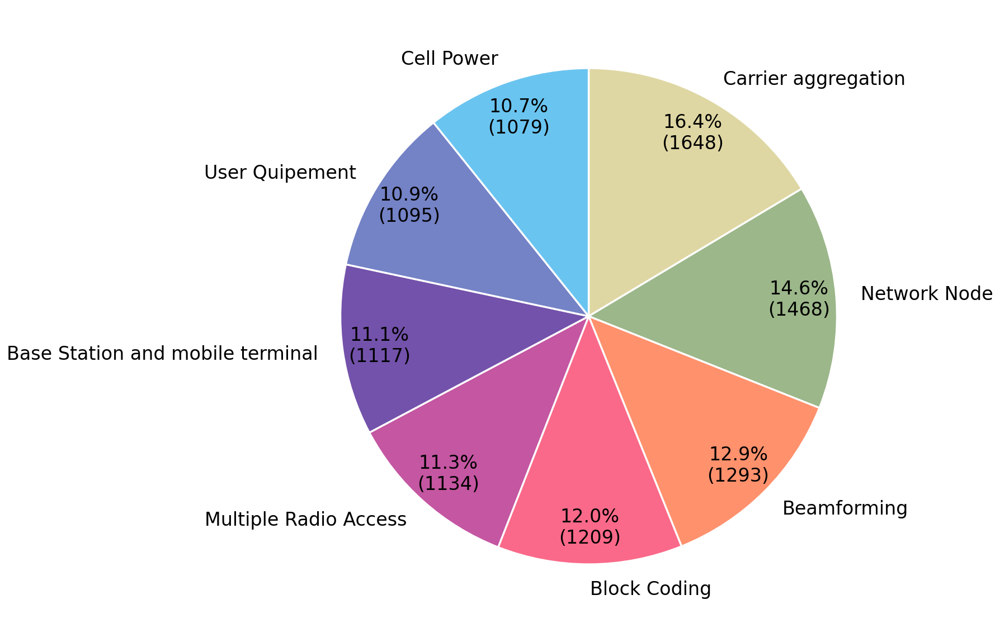

In [290]:
# Make a pie plot
labels = df_dominant_topics["Topic_Labels"]
sizes = df_dominant_topics["Num_Documents"]
fig1,ax1 = plt.subplots(figsize=(15,15))

def func(pct, allvals):
    absolute = int(np.round(pct/100.*np.sum(allvals)))
    return "{:.1f}%\n({:d})".format(pct, absolute)



patches, texts, pcts = ax1.pie(sizes, labels=labels,
                               autopct=lambda pct: func(pct, sizes),
                               pctdistance=0.85,
                               wedgeprops={'linewidth': 2.0, 'edgecolor': 'white'},
                               textprops={'fontsize': 20},
                               counterclock = False,
                               startangle=90)

# for i, patch in enumerate(patches):
#     texts[i].set_color(patch.get_facecolor())
plt.setp(pcts, color='black')
plt.setp(texts, fontweight=200)
# ax1.set_title('Patent Contribution by Each Company', fontsize=36)
plt.tight_layout()

plt.savefig(r"C:\Users\jiame\Desktop\NLP\5G_picture\pie_chart2.jpg")

### Labeling topic for each document

In [165]:
topic_list = ["User Quipement","Multiple Radio Access","Carrier aggregation","Cell Power","Beamforming",'Block Coding','Network Node',"Base Station and mobile terminal"]
labels = []  
for i in range(df_dominant_topic.shape[0]):
    index = df_dominant_topic["Dominant_Topic"][i]
    labels.append(topic_list[index])

df_dominant_topic.insert(2,"Topic_Labels",labels)

In [166]:
df_dominant_topic.head()

,Document_No,Dominant_Topic,Topic_Labels,Topic_Perc_Contrib,Keywords,Text
0,0,5,Block Coding,0.2503,"data, block, sequence, symbol, number, code, f...","[apparatus, processor, generating, scrambling,..."
1,1,3,Cell Power,0.2391,"cell, power, configuration, measurement, param...","[involves, triggering, signaling, order, alloc..."
2,2,2,Carrier aggregation,0.3084,"resource, control, uplink, downlink, carrier, ...","[involves, allocating, resource, downlink, phy..."
3,3,2,Carrier aggregation,0.3585,"resource, control, uplink, downlink, carrier, ...","[involves, receiving, set, uplink, main, part,..."
4,4,3,Cell Power,0.2529,"cell, power, configuration, measurement, param...","[involves, transmitting, sleep, cycle, identif..."


### Remake the df 

In [167]:
Assignee = text1["Assignee"]
YearPublished = text1["YearPublished"]
df = df_dominant_topic
df.insert(1,"Assignee",Assignee)
df.insert(2,"YearPublished",YearPublished)

### Leading technology in each topic

In [168]:
df1 = df.groupby("Topic_Labels")
df1.first()

,Document_No,Assignee,YearPublished,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
Topic_Labels,,,,,,,
Base Station and mobile terminal,6,LG,2011,7,0.3040,"station, base, terminal, unit, mobile, apparat...","[involves, changing, uplink, resource, recepti..."
Beamforming,8,LG,2011,4,0.2077,"reference, beam, receiving, state, transmittin...","[involves, mapping, status, reference, maximum..."
Block Coding,0,LG,2011,5,0.2503,"data, block, sequence, symbol, number, code, f...","[apparatus, processor, generating, scrambling,..."
Carrier aggregation,2,LG,2011,2,0.3084,"resource, control, uplink, downlink, carrier, ...","[involves, allocating, resource, downlink, phy..."
Cell Power,1,LG,2011,3,0.2391,"cell, power, configuration, measurement, param...","[involves, triggering, signaling, order, alloc..."
Multiple Radio Access,5,LG,2011,1,0.2485,"access, radio, multiple, division, frequency, ...","[involves, receiving, dedicated, reference, DR..."
Network Node,75,LG,2010,6,0.2071,"network, node, message, data, service, radio, ...","[performing, involves, copying, medium, access..."
User Quipement,888,LG,2015,0,0.2651,"UE, network, computer, apparatus, set, cellula...","[involves, calculating, utility, metric, UE, u..."


In [169]:
df1.get_group('Beamforming')
df2 = df1.get_group('Beamforming')

In [170]:
# def dominant_tech_per_topic(df):
df1 = df.groupby("Topic_Labels")
appened_df = []

for i in range(len(topic_list)):
    df2 = df1.get_group(topic_list[i])
    df2 = df2.sort_values(by="Topic_Perc_Contrib",ascending=False)
#     print(df2.iloc[0:2,:])
    df3 = df2.iloc[0:3,:]
    appened_df.append(df3)
#     print(df3)

dominant_tech = pd.concat(appened_df)
     
#     return dominant_tech
        

In [171]:
dominant_tech 
# dominant_tech = dominant_tech.drop(["Keywords","Text"],axis=1)
# dominant_tech 
# dfi.export(dominant_tech,'dominant_tech2.jpg')

,Document_No,Assignee,YearPublished,Dominant_Topic,Topic_Labels,Topic_Perc_Contrib,Keywords,Text
8951,8951,Intel,2017,0,User Quipement,0.5736,"UE, network, computer, apparatus, set, cellula...","[apparatus, processing, circuitry, scanning, b..."
9999,9999,Intel,2018,0,User Quipement,0.5473,"UE, network, computer, apparatus, set, cellula...","[NR, testing, apparatus, includes, NR, radio-f..."
8647,8647,Intel,2017,0,User Quipement,0.5411,"UE, network, computer, apparatus, set, cellula...","[apparatus, contention, management, circuitry,..."
1454,1454,LG,2018,1,Multiple Radio Access,0.6040,"access, radio, multiple, division, frequency, ...","[involves, receiving, set, set, random, access..."
1425,1425,LG,2018,1,Multiple Radio Access,0.5808,"access, radio, multiple, division, frequency, ...","[involves, selecting, beam, group, including, ..."
1002,1002,LG,2014,1,Multiple Radio Access,0.5545,"access, radio, multiple, division, frequency, ...","[involves, forming, reference, uplink-down, li..."
993,993,LG,2014,2,Carrier aggregation,0.5882,"resource, control, uplink, downlink, carrier, ...","[transmitting, uplink, receipt, confirmation, ..."
4553,4553,Samsung,2012,2,Carrier aggregation,0.5557,"resource, control, uplink, downlink, carrier, ...","[involves, receiving, uplink, UL, grant, UE, U..."
2093,2093,Ericsson,2014,2,Carrier aggregation,0.5469,"resource, control, uplink, downlink, carrier, ...","[involves, receiving, PDSCHs, downlink, DL, su..."
130,130,LG,2009,3,Cell Power,0.5920,"cell, power, configuration, measurement, param...","[involves, evaluating, s10, priority, serving,..."


### Each companies' patent number in each topic

In [172]:
company_df = df.drop(["Keywords","Text"],axis = 1)
company_df

,Document_No,Assignee,YearPublished,Dominant_Topic,Topic_Labels,Topic_Perc_Contrib
0,0,LG,2011,5,Block Coding,0.2503
1,1,LG,2011,3,Cell Power,0.2391
2,2,LG,2011,2,Carrier aggregation,0.3084
3,3,LG,2011,2,Carrier aggregation,0.3585
4,4,LG,2011,3,Cell Power,0.2529
...,...,...,...,...,...,...
10038,10038,Interdigital,2018,4,Beamforming,0.2768
10039,10039,Interdigital,2018,4,Beamforming,0.3481
10040,10040,CHINA DT,2018,6,Network Node,0.3441
10041,10041,Intel,2018,0,User Quipement,0.2802


####  groupby().size(): The most simple method for pandas groupby count is by using the in-built pandas method named size(). It returns a pandas series that possess the total number of row count for each group.

In [173]:
df4 = company_df.iloc[:,1:5]
df5 = df4.groupby(["Topic_Labels","Assignee"],sort=False).size().reset_index(name="Counts")
df5 =df5.groupby(["Topic_Labels","Assignee"],sort=False).agg({'Counts':sum})
df5["%"] = round(df5["Counts"]/df5.groupby(["Topic_Labels"])["Counts"].sum()*100,3)
company_stat = df5["Counts"].groupby('Topic_Labels', group_keys=False,sort=False).nlargest()
company_stat = company_stat.to_frame()
company_stat
# dfi.export(company_stat,'company_stat.jpg')

Counts
Topic_Labels                     Assignee          
Block Coding                     Samsung        331
                                 Huawei         193
                                 Qualcomm       126
                                 LG             111
                                 Ericsson       104
Cell Power                       Samsung        263
                                 LG             166
                                 Nokia          165
                                 Huawei         145
                                 Ericsson       132
Carrier aggregation              LG             396
                                 Samsung        340
                                 Huawei         235
                                 Nokia          113
                                 Qualcomm       110
Multiple Radio Access            LG             538
                                 Samsung        135
                                 Qualcomm       129
                                 Huawei          87
                                 Ericsson        48
Base Station and mobile terminal SHARP          316
                                 NTT DOCOMO     306
                                 Samsung        176
                                 Huawei         108
                                 LG              71
Beamforming                      Samsung        322
                                 LG             295
                                 Huawei         196
                                 Ericsson       102
                                 Qualcomm       102
Network Node                     Nokia          319
                                 Samsung        308
                                 Huawei         215
                                 Ericsson       164
                                 LG              93
User Quipement                   Intel          306
                                 Qualcomm       203
                                 Nokia          152
                                 Samsung        103
                                 Ericsson        87

### Patent Contribution by Each Company

In [176]:
# Make a dataframe which records the ccontribution by each company
total_count = company_df.groupby(["Assignee"],sort=False).size().reset_index(name="Total Count")
total_count = total_count.sort_values(by="Total Count",ascending=False)

C:\Users\jiame\AppData\Local\Temp\ipykernel_10228\3192552845.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  greater_than_3 = greater_than_3.append(new_row,ignore_index=True)


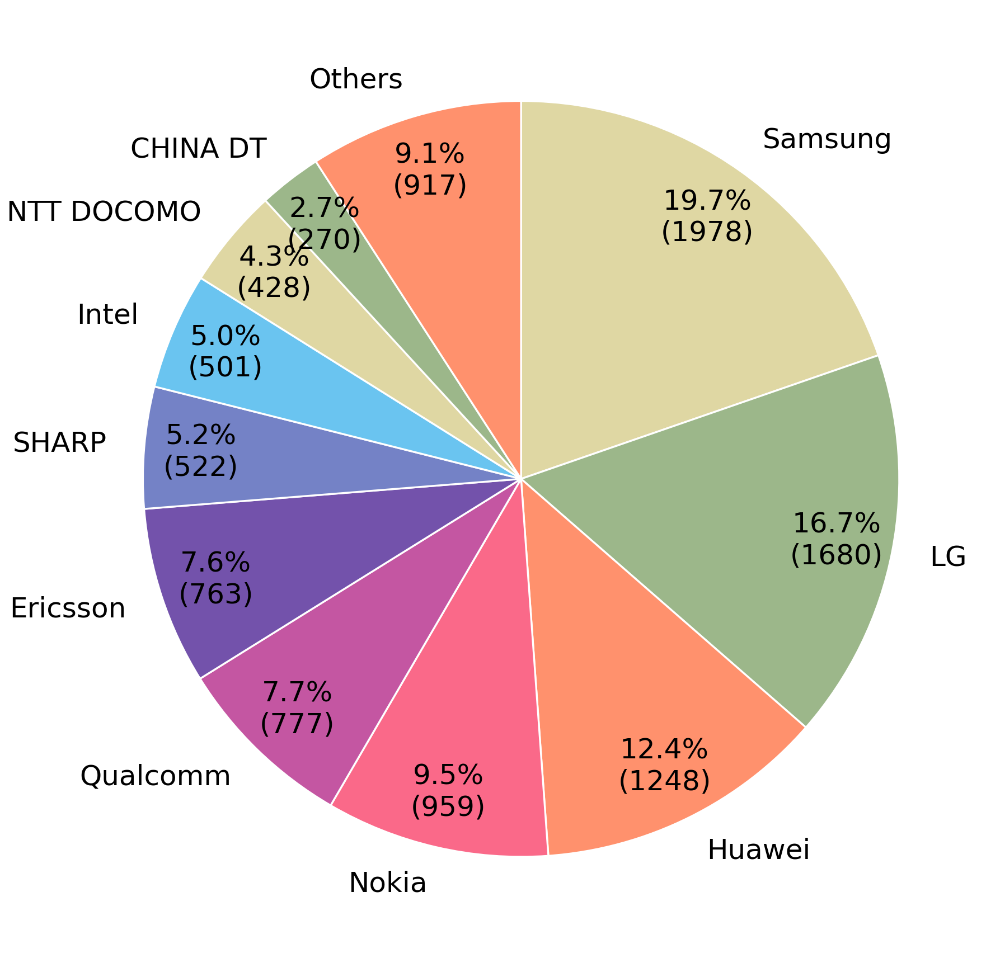

In [289]:
# Find the ccontribution percentage
Perc_Contrib = round(total_count["Total Count"]/sum(total_count["Total Count"]),3)
total_count = total_count.assign(Perc_Contrib= Perc_Contrib)
total_count = total_count.reset_index(drop = True)
# total_count 

# Assign new name "others" for Perc_Contrib < 0.2
lower_than_3 = total_count[total_count["Perc_Contrib"]<0.02]
lower_than_3.sum(axis=0)

# index of total_count that has Perc_Contrib < 0.2 
total_count.index[total_count['Perc_Contrib']<0.02]
# get the result: first index is 10
greater_than_3 = total_count.iloc[0:10,:]

# # make the whole dataframe 
new_row = {"Assignee":"Others","Total Count":917,"Perc_Contrib":0.088}
greater_than_3 = greater_than_3.append(new_row,ignore_index=True)
greater_than_3

# Make a pie plot
labels = greater_than_3["Assignee"]
sizes = greater_than_3["Total Count"]
fig1,ax1 = plt.subplots(figsize=(15,15))

def func(pct, allvals):
    absolute = int(np.round(pct/100.*np.sum(allvals)))
    return "{:.1f}%\n({:d})".format(pct, absolute)



patches, texts, pcts = ax1.pie(sizes, labels=labels,
                               autopct=lambda pct: func(pct, sizes),
                               pctdistance=0.85,
                               wedgeprops={'linewidth': 2.0, 'edgecolor': 'white'},
                               textprops={'fontsize': 30},
                               counterclock = False,
                               startangle=90)

# for i, patch in enumerate(patches):
#     texts[i].set_color(patch.get_facecolor())
plt.setp(pcts, color='black')
plt.setp(texts, fontweight=200)
# ax1.set_title('Patent Contribution by Each Company', fontsize=36)
plt.tight_layout()

plt.savefig(r"C:\Users\jiame\Desktop\NLP\5G_picture\pie_chart1.jpg")

### topic distribution in each company

In [178]:
company_df

,Document_No,Assignee,YearPublished,Dominant_Topic,Topic_Labels,Topic_Perc_Contrib
0,0,LG,2011,5,Block Coding,0.2503
1,1,LG,2011,3,Cell Power,0.2391
2,2,LG,2011,2,Carrier aggregation,0.3084
3,3,LG,2011,2,Carrier aggregation,0.3585
4,4,LG,2011,3,Cell Power,0.2529
...,...,...,...,...,...,...
10038,10038,Interdigital,2018,4,Beamforming,0.2768
10039,10039,Interdigital,2018,4,Beamforming,0.3481
10040,10040,CHINA DT,2018,6,Network Node,0.3441
10041,10041,Intel,2018,0,User Quipement,0.2802


In [234]:
c_topic = company_df.groupby(["Assignee","Topic_Labels"]).size().reset_index(name="Count_Per_Topic")
c_topic

,Assignee,Topic_Labels,Count_Per_Topic
0,ALU,Base Station and mobile terminal,2
1,ALU,Beamforming,3
2,ALU,Block Coding,11
3,ALU,Carrier aggregation,16
4,ALU,Cell Power,8
...,...,...,...
198,ZTE,Cell Power,14
199,ZTE,Multiple Radio Access,7
200,ZTE,Network Node,32
201,ZTE,User Quipement,22


In [291]:
# Make a function to draw pie chart for each company 
def pie_chart_for_company(name):
    topic_df = c_topic[c_topic["Assignee"]== name]
    topic_df = topic_df.sort_values(by="Count_Per_Topic",ascending=False)
    name1 = name.strip('"')

    # Make a pie plot
    labels = topic_df ["Topic_Labels"]
    sizes = topic_df ["Count_Per_Topic"]
    fig1,ax1 = plt.subplots(figsize=(20,10))
    patches, texts, pcts = ax1.pie(sizes, labels=labels,
                                   autopct = '%1.1f%%',
                                   pctdistance=0.85,
                                   wedgeprops={'linewidth': 2.0, 'edgecolor': 'white'},
                                   textprops={'fontsize': 24},
                                   counterclock = False,
                                   startangle=90)

#     for i, patch in enumerate(patches):
#         texts[i].set_color(patch.get_facecolor())
    plt.setp(pcts, color='black')
    plt.setp(texts, fontweight=200)
    ax1.set_title("{}".format(name), fontsize=30)
    plt.tight_layout()
    plt.savefig(r"C:\Users\jiame\Desktop\NLP\5G_company\{}.jpg".format(name1))
#     return 


C:\Users\jiame\AppData\Local\Temp\ipykernel_10228\3732985770.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig1,ax1 = plt.subplots(figsize=(20,10))


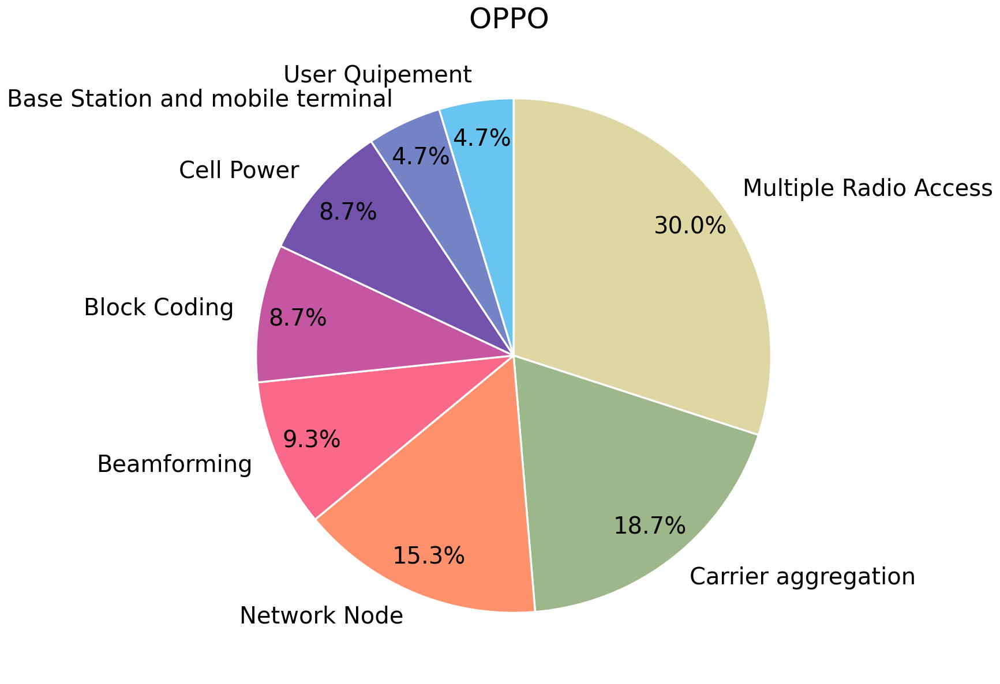

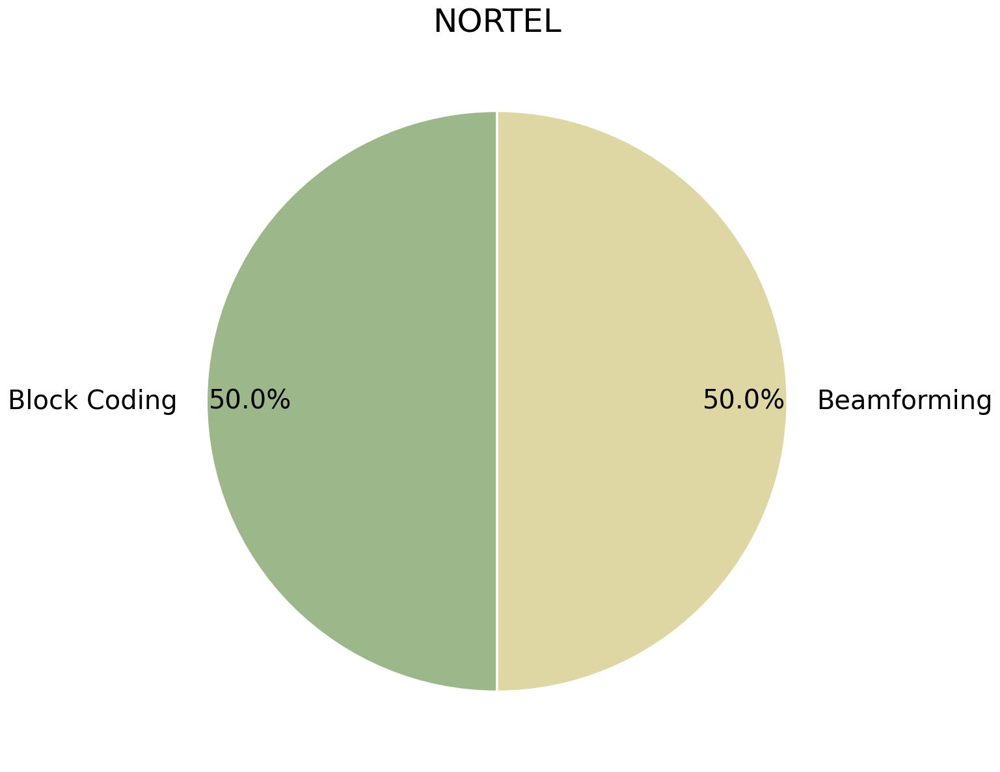

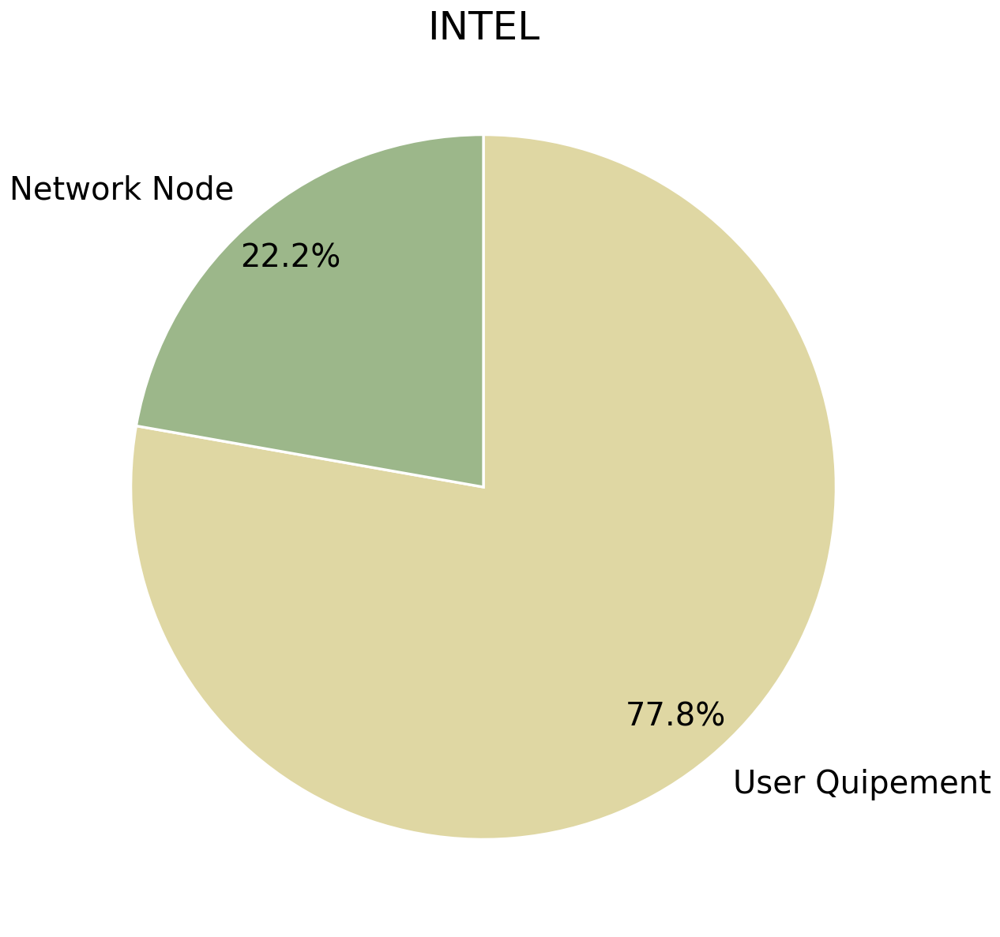

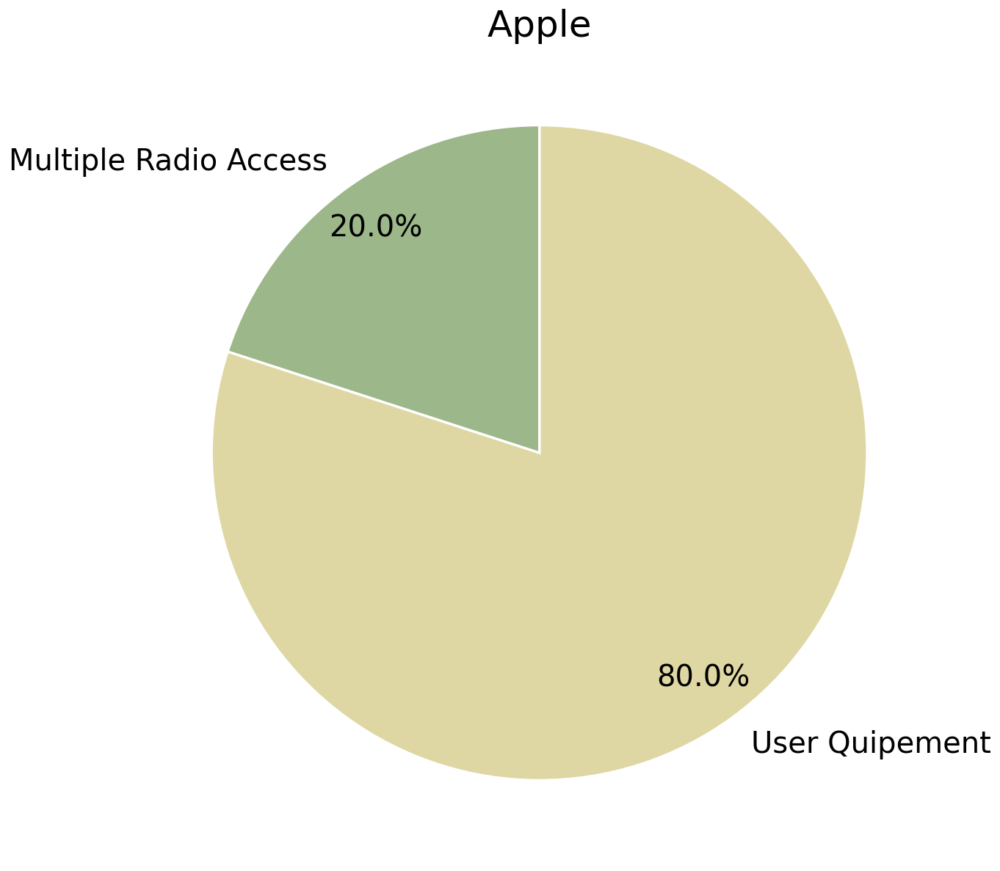

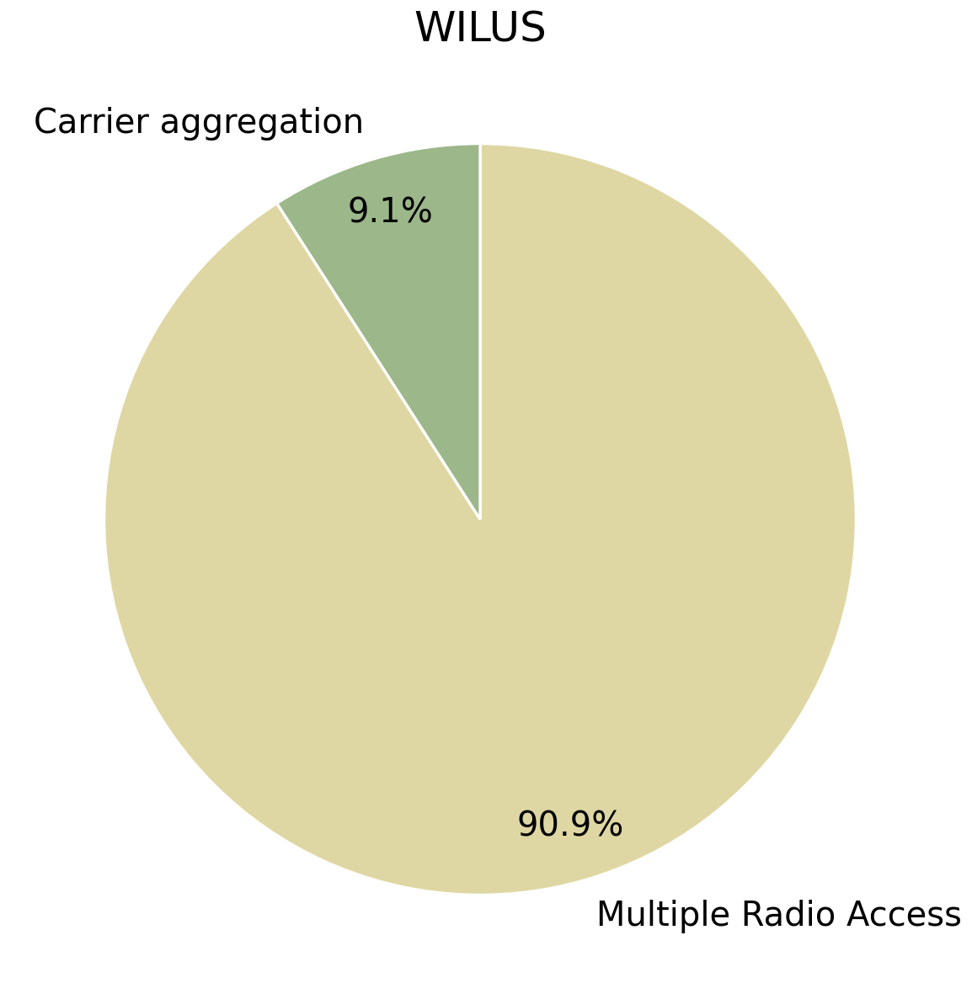

...

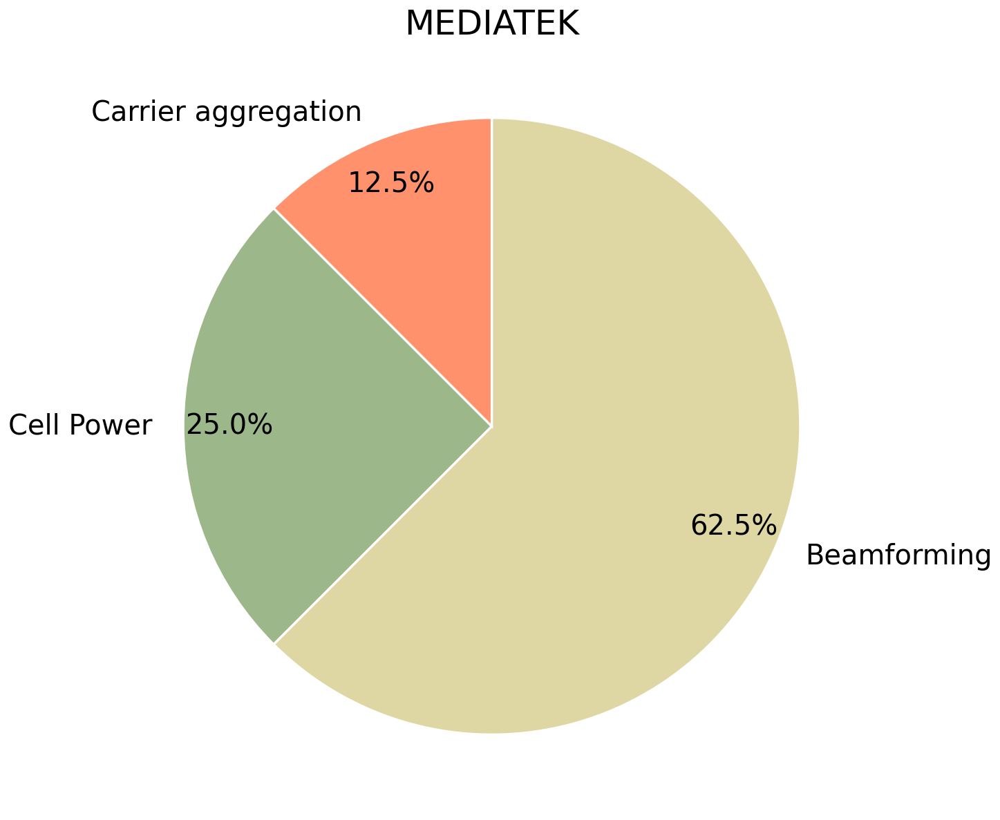

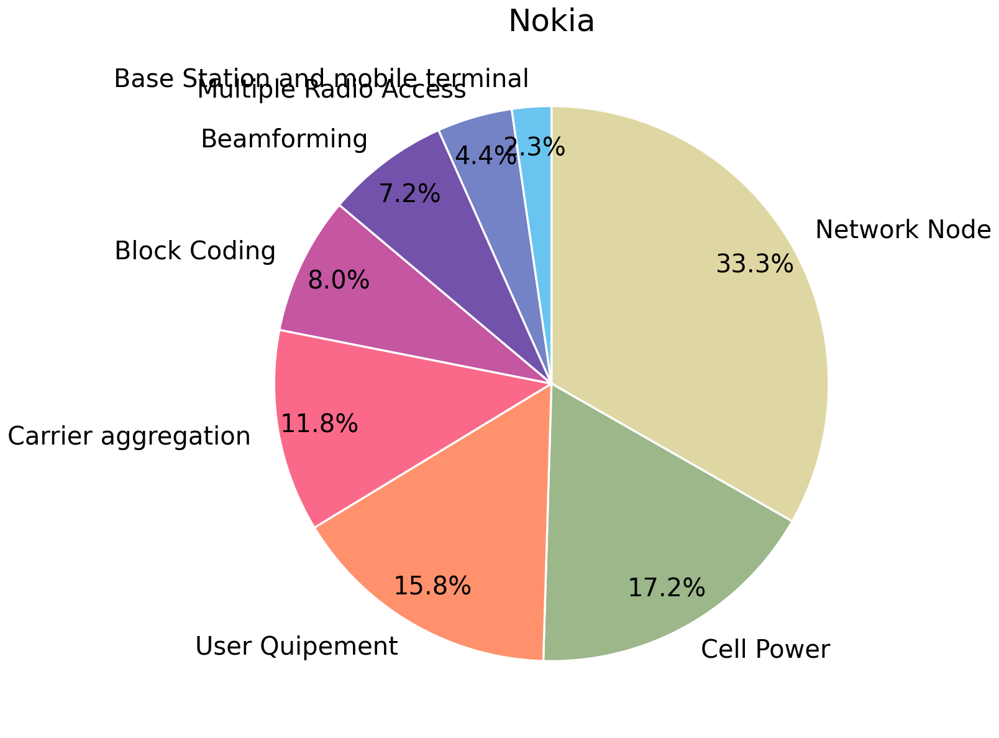

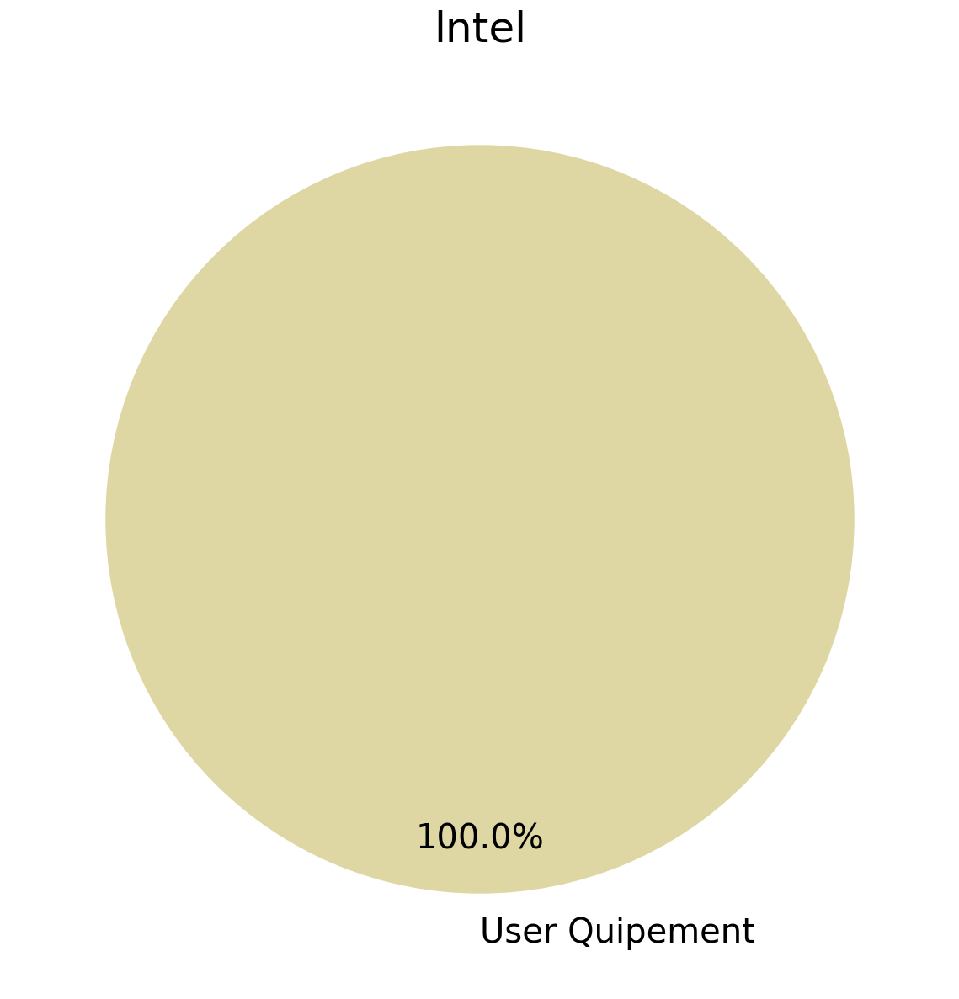

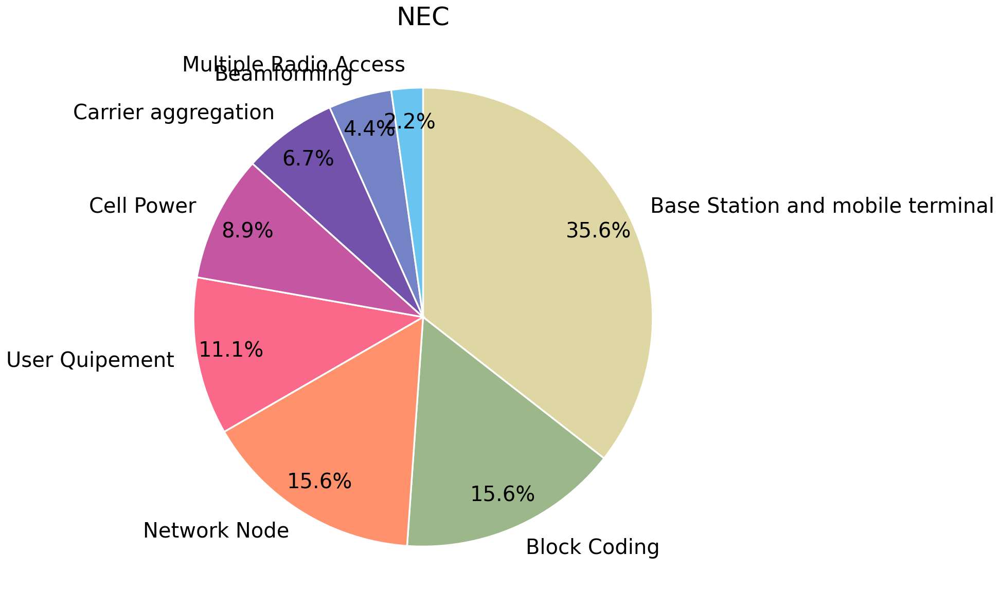

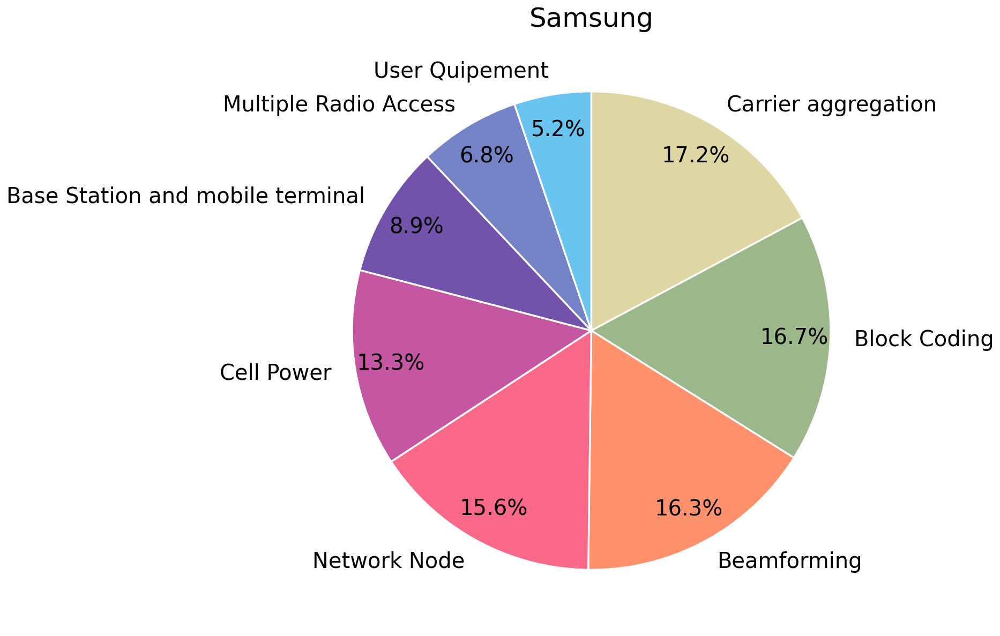

In [292]:
company_name = set(company_df["Assignee"])
for i in company_name:
    pie_chart_for_company(i)


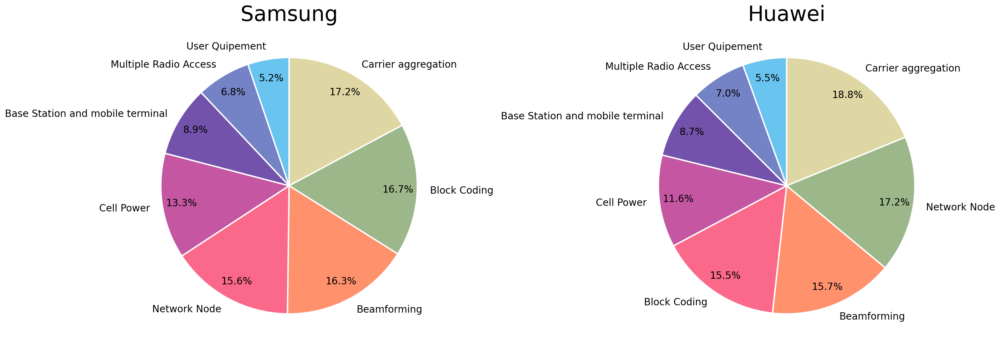

In [295]:
# the same figure for both subplots
fig = plt.figure(figsize=(20,10),dpi=144)

# axes object for the first pie chart 
# fig.add_subplot(121) will create a grid of subplots consisting 
# of one row (the first 1 in (121)), two columns (the 2 in (121)) 
# and place the axes object as the first subplot 
# in the grid (the second 1 in (121))
ax1 = fig.add_subplot(121)

# plot the first pie chart in ax1
topic_df = c_topic[c_topic["Assignee"]== "Samsung"]
topic_df = topic_df.sort_values(by="Count_Per_Topic",ascending=False)
labels = topic_df ["Topic_Labels"]
sizes = topic_df ["Count_Per_Topic"]
patches, texts, pcts = ax1.pie(sizes, autopct = '%1.1f%%',labels=labels,
                                   pctdistance=0.85,
                                   wedgeprops={'linewidth': 2.0, 'edgecolor': 'white'},
                                   textprops={'fontsize': 14},
                                   counterclock = False,
                                   startangle=90)
# for i, patch in enumerate(patches):
#     texts[i].set_color(patch.get_facecolor())
plt.setp(pcts, color='black')
plt.setp(texts, fontweight=200)

ax1.set_title("Samsung", fontsize=30)
# axes object for the second pie chart 
# fig.add_subplot(122) will place ax2 as the second 
# axes object in the grid of the same shape as specified for ax1 
ax2 = fig.add_subplot(122)

# plot the sencond pie chart in ax2
topic_df = c_topic[c_topic["Assignee"]== "Huawei"]
topic_df = topic_df.sort_values(by="Count_Per_Topic",ascending=False)
labels = topic_df ["Topic_Labels"]
sizes = topic_df ["Count_Per_Topic"]
patches, texts, pcts =  ax2.pie(sizes, autopct = '%1.1f%%',labels=labels,
                                   pctdistance=0.85,
                                   wedgeprops={'linewidth': 2.0, 'edgecolor': 'white'},
                                   textprops={'fontsize': 14},
                                   counterclock = False,
                                   startangle=90)
# for i, patch in enumerate(patches):
#     texts[i].set_color(patch.get_facecolor())
plt.setp(pcts, color='black')
plt.setp(texts, fontweight=200)


ax2.set_title("Huawei", fontsize=30)
plt.tight_layout()


plt.savefig(r"C:\Users\jiame\Desktop\NLP\5G_company\comparison.jpg")


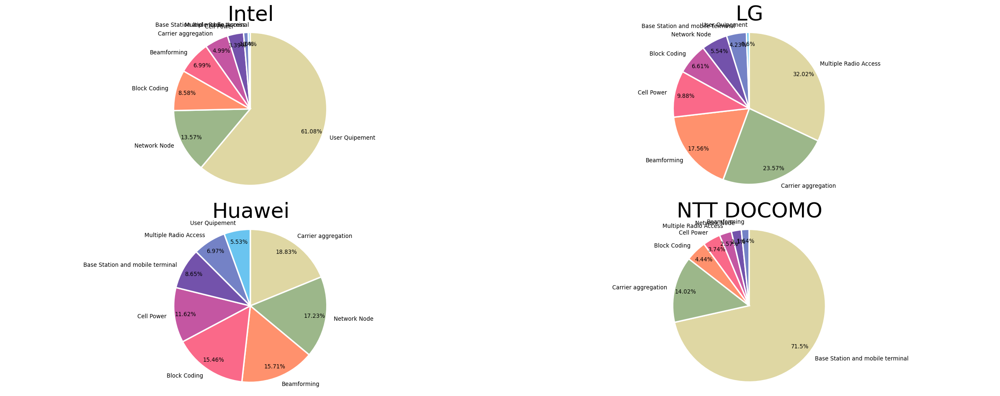

In [229]:
rows=2
cols=2

company_name = ['Intel','LG','Huawei','NTT DOCOMO']

fig, ax = plt.subplots(rows, cols, figsize=(20,8),dpi=120)

row=0 
col=0 

for i in company_name:
    topic_df = c_topic[c_topic["Assignee"]== i]
    topic_df = topic_df.sort_values(by="Count_Per_Topic",ascending=False)
    labels = topic_df ["Topic_Labels"]
    sizes = topic_df ["Count_Per_Topic"]
    patches, texts, pcts = ax[row][col].pie(sizes, labels=labels,
                                   pctdistance=0.85,
                                   autopct=lambda x: '{}%'.format(round(x,2)),
                                   wedgeprops={'linewidth': 2.0, 'edgecolor': 'white'},
                                   counterclock = False,
                                   textprops={'fontsize': 8},
                                   startangle=90)
    
    plt.setp(pcts, color='black')
    plt.setp(texts, fontweight=200)
    ax[row][col].axis('equal')
    ax[row][col].set_title("{}".format(i),fontsize=30)
    plt.tight_layout()
    
    col += 1
    if col == cols:
        col = 0
        row +=1
        
plt.savefig(r"C:\Users\jiame\Desktop\NLP\5G_company\leading_tech.jpg")


### Percent stacked bar chart 

In [183]:
year_df = company_df.groupby(["YearPublished","Topic_Labels"]).size().reset_index(name="No/Topic/Year")
year_df = year_df.pivot(index = "YearPublished", columns = 'Topic_Labels',values="No/Topic/Year")
year_df = year_df.replace(np.nan, 0)
# # 去掉multi-index
# year_df  = year_df.rename_axis(None)
# year_df.reset_index(inplace = True)
# year_df.rename(columns={"index":"YearPublished"})

year_df 

Topic_Labels,Base Station and mobile terminal,Beamforming,Block Coding,Carrier aggregation,Cell Power,Multiple Radio Access,Network Node,User Quipement
YearPublished,,,,,,,,
1996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1998,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1999,2.0,1.0,0.0,0.0,2.0,0.0,3.0,0.0
2000,1.0,0.0,6.0,0.0,3.0,1.0,11.0,0.0
2001,2.0,0.0,2.0,0.0,4.0,2.0,6.0,1.0
2002,3.0,3.0,18.0,0.0,1.0,1.0,16.0,0.0
2003,3.0,4.0,29.0,1.0,2.0,1.0,11.0,2.0
2004,2.0,4.0,13.0,4.0,2.0,6.0,12.0,2.0
2005,6.0,7.0,31.0,5.0,2.0,8.0,18.0,2.0


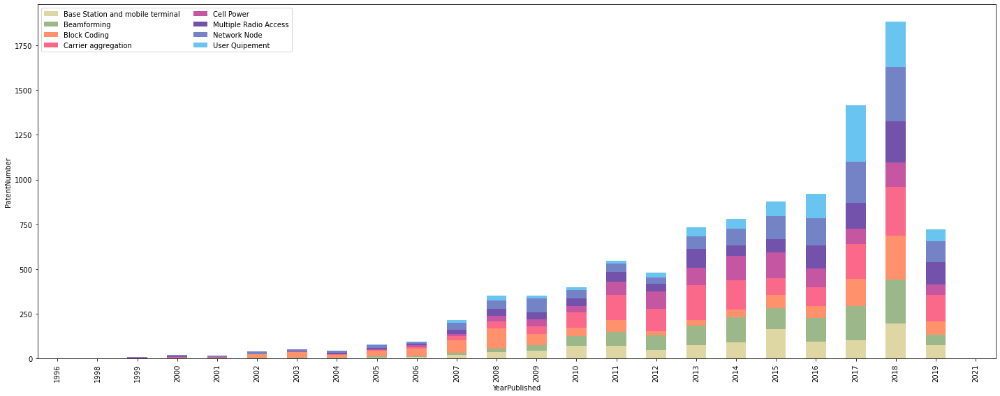

In [184]:
year_df .plot(kind='bar', 
                    stacked=True, 
                    figsize=(20, 8))

plt.legend(loc="upper left", ncol=2)
plt.xlabel("YearPublished")
plt.ylabel("PatentNumber")
plt.savefig(r"C:\Users\jiame\Desktop\NLP\5G_company\stacked_bar.jpg")
plt.show()



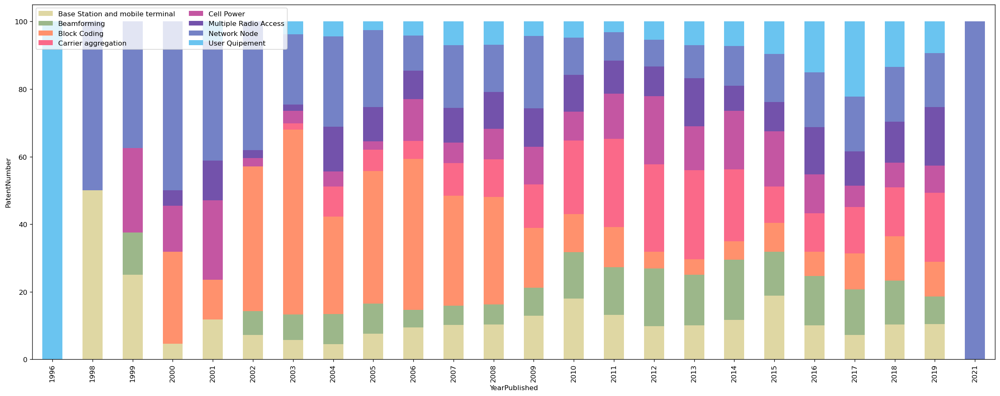

In [222]:
year_df = year_df.apply(lambda x:x*100/sum(x),axis=1)
year_df .plot(kind='bar', 
                    stacked=True, 
                    figsize=(20, 8))

plt.legend(loc="upper left", ncol=2)
plt.xlabel("YearPublished")
plt.ylabel("PatentNumber")
plt.savefig(r"C:\Users\jiame\Desktop\NLP\5G_company\stacked_bar_2.jpg")
plt.show()


### Grouped Bar Chart with labels

In [300]:
data = text1[(text1["Assignee"] == "Samsung" )| (text1["Assignee"] == "Huawei")]
data = data.groupby(["YearPublished","Assignee"]).size().reset_index(name="CountPerYear")
data.head()

,YearPublished,Assignee,CountPerYear
0,2000,Samsung,1
1,2002,Samsung,9
2,2003,Samsung,15
3,2004,Samsung,13
4,2005,Huawei,1


In [301]:
labels = list(set(data["YearPublished"]))
Samsung = list(data[data["Assignee"] == "Samsung"]["CountPerYear"])

y = list(range(2002,2020))
y.append(2021)
y.insert(0,2000)

Huawei = []
# 注意pd.Series如何返回只返回数值 -> a.values[0]
# 注意抓取df时，如果条件是两个时候，注意小括号和中括号
for i in y:
    if "Huawei" not in list(data[data["YearPublished"] == i]["Assignee"]):
        Huawei.append(0)
    else:
        a = data[(data["YearPublished"]== i) & (data["Assignee"] == "Huawei")]["CountPerYear"]
        Huawei.append(a.values[0])
  

In [188]:
C6 = '#7352AB'
C7 = "#7482C6"

20 20 20


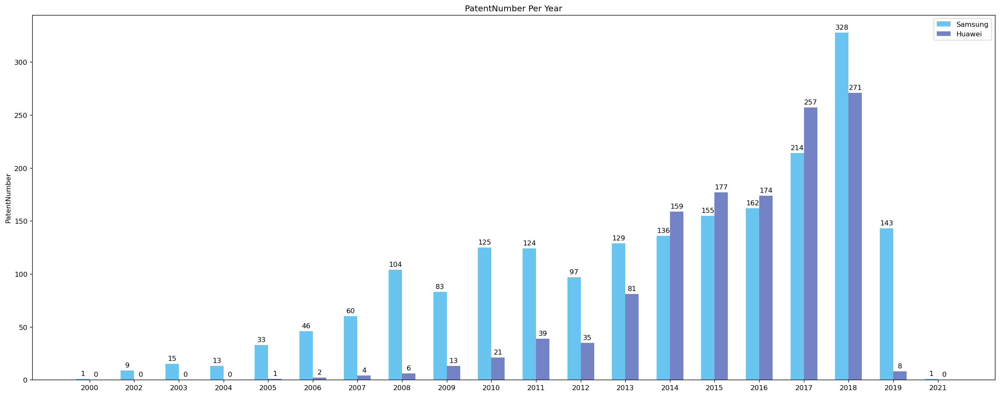

In [302]:
x = np.arange(len(labels))
width = 0.3

fig, ax = plt.subplots(figsize=(20, 8),dpi=120)
rects1 = ax.bar(x - width/2, Samsung, width, label='Samsung',color='#6AC4F0')
rects2 = ax.bar(x + width/2, Huawei, width, label='Huawei',color="#7482C6")

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('PatentNumber')
ax.set_title('PatentNumber Per Year')
ax.set_xticks(x, labels)
ax.legend()

ax.bar_label(rects1, padding=3)
ax.bar_label(rects2, padding=3)

fig.tight_layout()
plt.savefig(r"C:\Users\jiame\Desktop\NLP\5G_picture\grouped_bar.jpg")

plt.show()

### Horizontal Stacked bar chart for Samsung and Huawei

In [264]:
data2 = company_df.groupby(["YearPublished","Assignee","Topic_Labels"]).size().reset_index(name="No/Topic/Year")
data2 = data2[(data2["Assignee"]=="Samsung") | (data2["Assignee"]=="Huawei")]
data2 = data2[(data2["YearPublished"]>2004) & (data2["YearPublished"]<=2018)]
data2

,YearPublished,Assignee,Topic_Labels,No/Topic/Year
91,2005,Huawei,Network Node,1
111,2005,Samsung,Base Station and mobile terminal,2
112,2005,Samsung,Beamforming,2
113,2005,Samsung,Block Coding,20
114,2005,Samsung,Carrier aggregation,1
...,...,...,...,...
1080,2018,Samsung,Carrier aggregation,59
1081,2018,Samsung,Cell Power,28
1082,2018,Samsung,Multiple Radio Access,28
1083,2018,Samsung,Network Node,69


In [191]:
# data2 = data2.pivot(index = ["YearPublished","Assignee"], columns= "Topic_Labels", values="No/Topic/Year")
# data2 = data2.replace(np.nan,0)
# data2

In [273]:
data_sam = data2.loc[data2["Assignee"] == "Samsung",:]
data_sam = data_sam.pivot(index = ["YearPublished","Assignee"], columns= "Topic_Labels", values="No/Topic/Year")
data_sam = data_sam.replace(np.nan,0)
data_sam = data_sam.apply(lambda x:x*100/sum(x),axis=1)
data_sam = data_sam.droplevel(level=1)
data_sam

Topic_Labels,Base Station and mobile terminal,Beamforming,Block Coding,Carrier aggregation,Cell Power,Multiple Radio Access,Network Node,User Quipement
YearPublished,,,,,,,,
2005,6.060606,6.060606,60.606061,3.030303,6.060606,3.030303,15.151515,0.000000
2006,8.695652,4.347826,50.000000,6.521739,17.391304,4.347826,8.695652,0.000000
2007,10.000000,8.333333,35.000000,13.333333,10.000000,5.000000,16.666667,1.666667
2008,4.807692,7.692308,38.461538,21.153846,7.692308,9.615385,8.653846,1.923077
2009,10.843373,12.048193,38.554217,14.457831,6.024096,2.409639,14.457831,1.204819
2010,10.400000,17.600000,19.200000,24.000000,8.000000,4.800000,10.400000,5.600000
2011,11.290323,13.709677,14.516129,24.193548,14.516129,6.451613,13.709677,1.612903
2012,8.247423,14.432990,3.092784,25.773196,35.051546,8.247423,4.123711,1.030928
2013,6.201550,31.782946,5.426357,24.031008,13.953488,4.651163,9.302326,4.651163


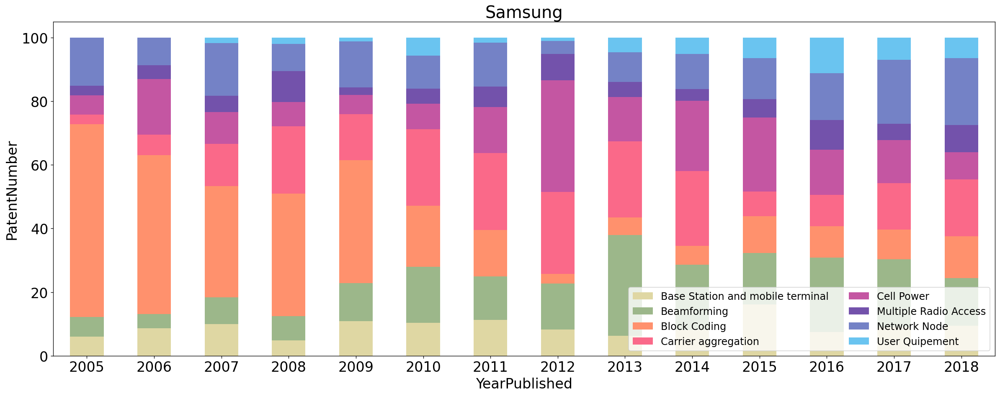

In [282]:
plt.rcParams["figure.figsize"] = [20, 8]
plt.rcParams["figure.autolayout"] = True
plt.rcParams["figure.dpi"] = 120
data_sam.plot(kind='bar', 
                    stacked=True, 
                    color = color_list)

plt.legend(loc="lower right", ncol=2,fontsize = "x-large")
plt.xlabel("YearPublished",size=20)
plt.ylabel("PatentNumber",size=20)
plt.title("Samsung",size=24)
plt.yticks(size=20)
plt.xticks(rotation = 0,size=20)
plt.savefig(r"C:\Users\jiame\Desktop\NLP\5G_picture\stacked_bar_S.jpg")
plt.show()

In [280]:
data_H = data2.loc[data2["Assignee"] == "Huawei",:]
data_H = data_H.pivot(index = ["YearPublished","Assignee"], columns= "Topic_Labels", values="No/Topic/Year")
data_H = data_H.replace(np.nan,0)
data_H = data_H.apply(lambda x:x*100/sum(x),axis=1)
data_H = data_H.droplevel(level=1)
data_H

Topic_Labels,Base Station and mobile terminal,Beamforming,Block Coding,Carrier aggregation,Cell Power,Multiple Radio Access,Network Node,User Quipement
YearPublished,,,,,,,,
2005,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,100.000000,0.000000
2006,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,100.000000,0.000000
2007,0.000000,0.000000,75.000000,0.000000,25.000000,0.000000,0.000000,0.000000
2008,0.000000,16.666667,50.000000,0.000000,16.666667,0.000000,16.666667,0.000000
2009,15.384615,0.000000,0.000000,15.384615,15.384615,0.000000,53.846154,0.000000
2010,4.761905,19.047619,14.285714,19.047619,19.047619,4.761905,14.285714,4.761905
2011,5.128205,20.512821,20.512821,23.076923,17.948718,5.128205,7.692308,0.000000
2012,2.857143,14.285714,8.571429,25.714286,28.571429,2.857143,11.428571,5.714286
2013,4.938272,13.580247,8.641975,35.802469,14.814815,3.703704,13.580247,4.938272


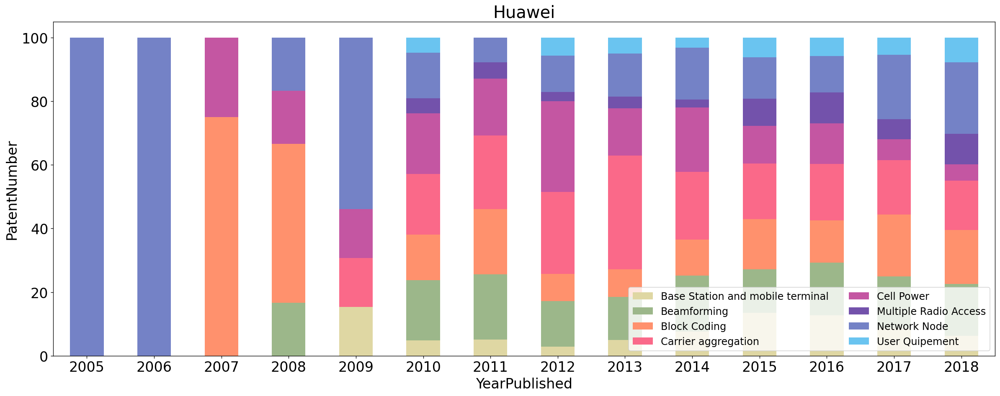

In [281]:
plt.rcParams["figure.figsize"] = [20, 8]
plt.rcParams["figure.autolayout"] = True
plt.rcParams["figure.dpi"] = 120

data_H.plot(kind='bar', 
                    fontsize= 20,
                    stacked=True, 
                    color = color_list)

plt.legend(loc="lower right", ncol=2,fontsize = "x-large")
plt.xlabel("YearPublished",size=20)
plt.ylabel("PatentNumber",size=20)
plt.title("Huawei",size=24)
plt.xticks(rotation = 0)
plt.savefig(r"C:\Users\jiame\Desktop\NLP\5G_picture\stacked_bar_H.jpg")
plt.show()

In [196]:
data_H.head()

,Topic_Labels,Base Station and mobile terminal,Beamforming,Block Coding,Carrier aggregation,Cell Power,Multiple Radio Access,Network Node,User Quipement
YearPublished,Assignee,,,,,,,,
2005,Huawei,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2006,Huawei,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0
2007,Huawei,0.0,0.0,3.0,0.0,1.0,0.0,0.0,0.0
2008,Huawei,0.0,1.0,3.0,0.0,1.0,0.0,1.0,0.0
2009,Huawei,2.0,0.0,0.0,2.0,2.0,0.0,7.0,0.0


### Discrete distribution as horizontal bar chart

In [197]:
def ectract_value(df,YearStart,YearEnd,Assignee):
    a = np.arange(YearStart,YearEnd+1)
    data_list = {}
    
    for i in a:
        data_list[i] = list(df.loc[i,Assignee])
    
    return data_list
    

In [198]:
H1 = ectract_value(data_H, 2005,2018,"Huawei")
S1 = ectract_value(data_sam, 2005,2018,"Samsung")
category_names = list(data_H.columns)
H1

{2005: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0],
 2006: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0],
 2007: [0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0],
 2008: [0.0, 1.0, 3.0, 0.0, 1.0, 0.0, 1.0, 0.0],
 2009: [2.0, 0.0, 0.0, 2.0, 2.0, 0.0, 7.0, 0.0],
 2010: [1.0, 4.0, 3.0, 4.0, 4.0, 1.0, 3.0, 1.0],
 2011: [2.0, 8.0, 8.0, 9.0, 7.0, 2.0, 3.0, 0.0],
 2012: [1.0, 5.0, 3.0, 9.0, 10.0, 1.0, 4.0, 2.0],
 2013: [4.0, 11.0, 7.0, 29.0, 12.0, 3.0, 11.0, 4.0],
 2014: [12.0, 28.0, 18.0, 34.0, 32.0, 4.0, 26.0, 5.0],
 2015: [24.0, 24.0, 28.0, 31.0, 21.0, 15.0, 23.0, 11.0],
 2016: [22.0, 29.0, 23.0, 31.0, 22.0, 17.0, 20.0, 10.0],
 2017: [22.0, 42.0, 50.0, 44.0, 17.0, 16.0, 52.0, 14.0],
 2018: [17.0, 44.0, 46.0, 42.0, 14.0, 26.0, 61.0, 21.0]}

In [199]:
def survey(results, category_names):
    """
    Parameters
    ----------
    results : dict
        A mapping from question labels to a list of answers per category.
        It is assumed all lists contain the same number of entries and that
        it matches the length of *category_names*.
    category_names : list of str
        The category labels.
    """
    labels = list(results.keys())
    data = np.array(list(results.values()))
    data_cum = data.cumsum(axis=1)
    category_colors = plt.colormaps['RdYlGn'](
        np.linspace(0.15, 0.85, data.shape[1]))

    fig, ax = plt.subplots(figsize=(20, 8),dpi=120)
    ax.invert_yaxis()
    ax.xaxis.set_visible(False)
    ax.set_xlim(0, np.sum(data, axis=1).max())

    for i, (colname, color) in enumerate(zip(category_names, category_colors)):
        widths = data[:, i]
        starts = data_cum[:, i] - widths
        rects = ax.barh(labels, widths, left=starts, height=0.5,
                        label=colname, color=color)

        r, g, b, _ = color
        text_color = 'white' if r * g * b < 0.5 else 'darkgrey'
        ax.bar_label(rects, label_type='center', color=text_color)
    ax.legend(ncol=len(category_names), bbox_to_anchor=(0, 1),
              loc='lower left', fontsize='small')

    return fig, ax


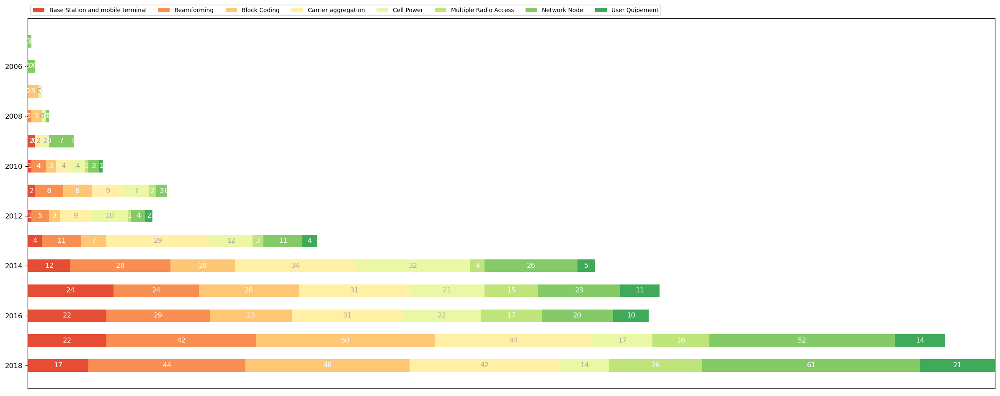

In [200]:
survey(H1, category_names)
plt.show()

### Stacked area chart

In [201]:
# C1 = '#DFD7A3'
# C2 = '#9CB78A'
# C3= '#FF916D'
# C4= '#FA6989'
# C5 = '#C456A2'
# C6 = '#7352AB'
# C7 = "#7482C6"
# C8 = "#6AC4F0"
# #6AC4F0
# color_list = [C1, C2, C3, C4, C5,C6,C7,C8]
# matplotlib.rcParams['axes.prop_cycle'] = matplotlib.cycler(color=color_list) 

In [202]:
def tech_num_per_year(df):
    columns = list(df.columns)
    data_list = {}
    for i in columns:
        data_list[i] = list(df[i])
    return data_list

In [203]:
H2 = tech_num_per_year(data_H)
H2 = pd.DataFrame.from_dict(H2)
year = np.arange(2005,2019)

H2

,Base Station and mobile terminal,Beamforming,Block Coding,Carrier aggregation,Cell Power,Multiple Radio Access,Network Node,User Quipement
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0
2,0.0,0.0,3.0,0.0,1.0,0.0,0.0,0.0
3,0.0,1.0,3.0,0.0,1.0,0.0,1.0,0.0
4,2.0,0.0,0.0,2.0,2.0,0.0,7.0,0.0
5,1.0,4.0,3.0,4.0,4.0,1.0,3.0,1.0
6,2.0,8.0,8.0,9.0,7.0,2.0,3.0,0.0
7,1.0,5.0,3.0,9.0,10.0,1.0,4.0,2.0
8,4.0,11.0,7.0,29.0,12.0,3.0,11.0,4.0
9,12.0,28.0,18.0,34.0,32.0,4.0,26.0,5.0


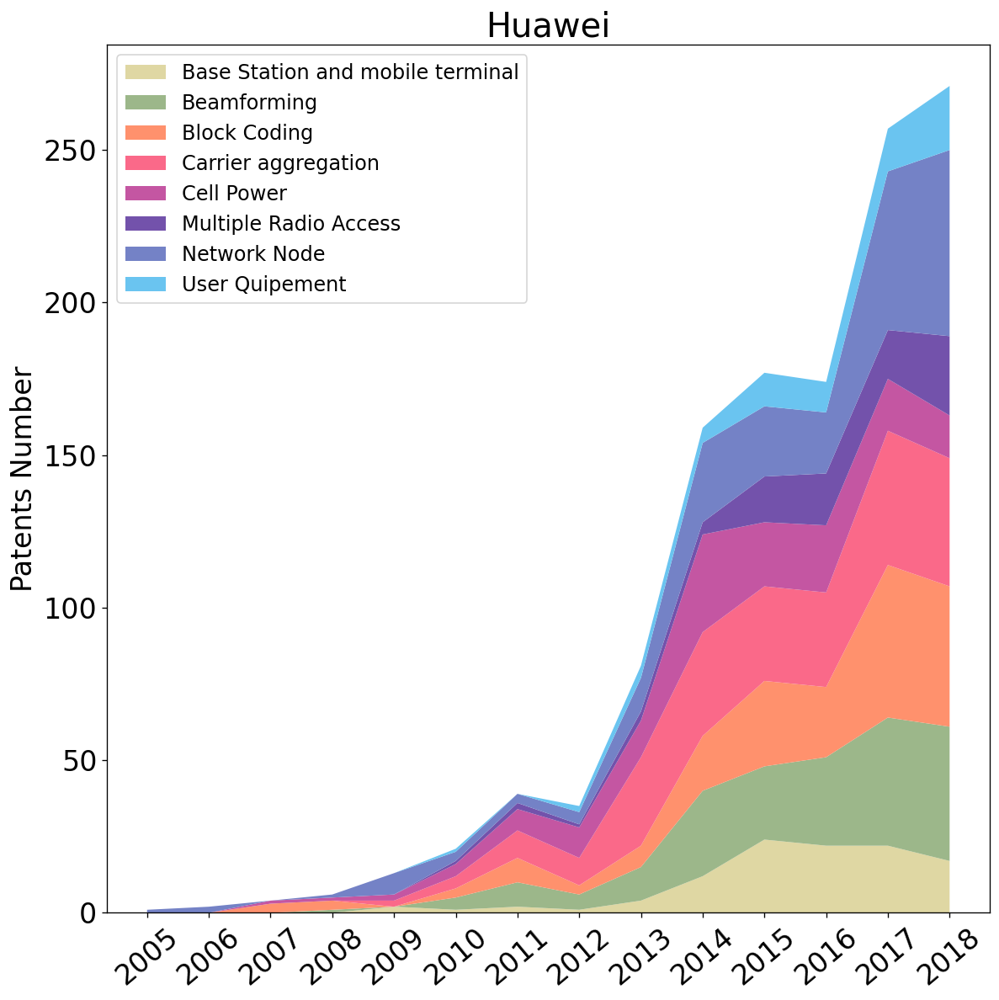

In [204]:
Base_station = H2.iloc[:,0]
Beamforming = H2.iloc[:,1]
Block_coding = H2.iloc[:,2]
Carrier_aggregation = H2.iloc[:,3]
Cell_power = H2.iloc[:,4]
Multiple_radio_access = H2.iloc[:,5]
Network_node = H2.iloc[:,6]
User_quipement = H2.iloc[:,7]

plt.figure(figsize=(10,10),dpi=120)
labels = ['Base Station and mobile terminal', 'Beamforming', 'Block Coding',
       'Carrier aggregation', 'Cell Power', 'Multiple Radio Access',
       'Network Node', 'User Quipement']
plt.stackplot(year,Base_station,Beamforming,Block_coding,
              Carrier_aggregation,Cell_power,Multiple_radio_access,
              Network_node,User_quipement, labels =labels,
              colors = color_list) 
plt.legend(loc = "upper left", ncol=1,fontsize = "x-large" )

plt.title("Huawei",size =24)
plt.ylabel('Patents Number',size = 20)
plt.xticks(np.arange(2005,2019,step=1), rotation=40, size = 20)
plt.yticks(size = 20)

plt.savefig(r"C:\Users\jiame\Desktop\NLP\5G_picture\Huawei_stacked_area.jpg")
plt.show()

In [205]:
S2 = tech_num_per_year(data_sam)
S2 = pd.DataFrame.from_dict(S2)
year = np.arange(2005,2019)

S2

,Base Station and mobile terminal,Beamforming,Block Coding,Carrier aggregation,Cell Power,Multiple Radio Access,Network Node,User Quipement
0,2.0,2.0,20.0,1.0,2.0,1.0,5.0,0.0
1,4.0,2.0,23.0,3.0,8.0,2.0,4.0,0.0
2,6.0,5.0,21.0,8.0,6.0,3.0,10.0,1.0
3,5.0,8.0,40.0,22.0,8.0,10.0,9.0,2.0
4,9.0,10.0,32.0,12.0,5.0,2.0,12.0,1.0
5,13.0,22.0,24.0,30.0,10.0,6.0,13.0,7.0
6,14.0,17.0,18.0,30.0,18.0,8.0,17.0,2.0
7,8.0,14.0,3.0,25.0,34.0,8.0,4.0,1.0
8,8.0,41.0,7.0,31.0,18.0,6.0,12.0,6.0
9,11.0,28.0,8.0,32.0,30.0,5.0,15.0,7.0


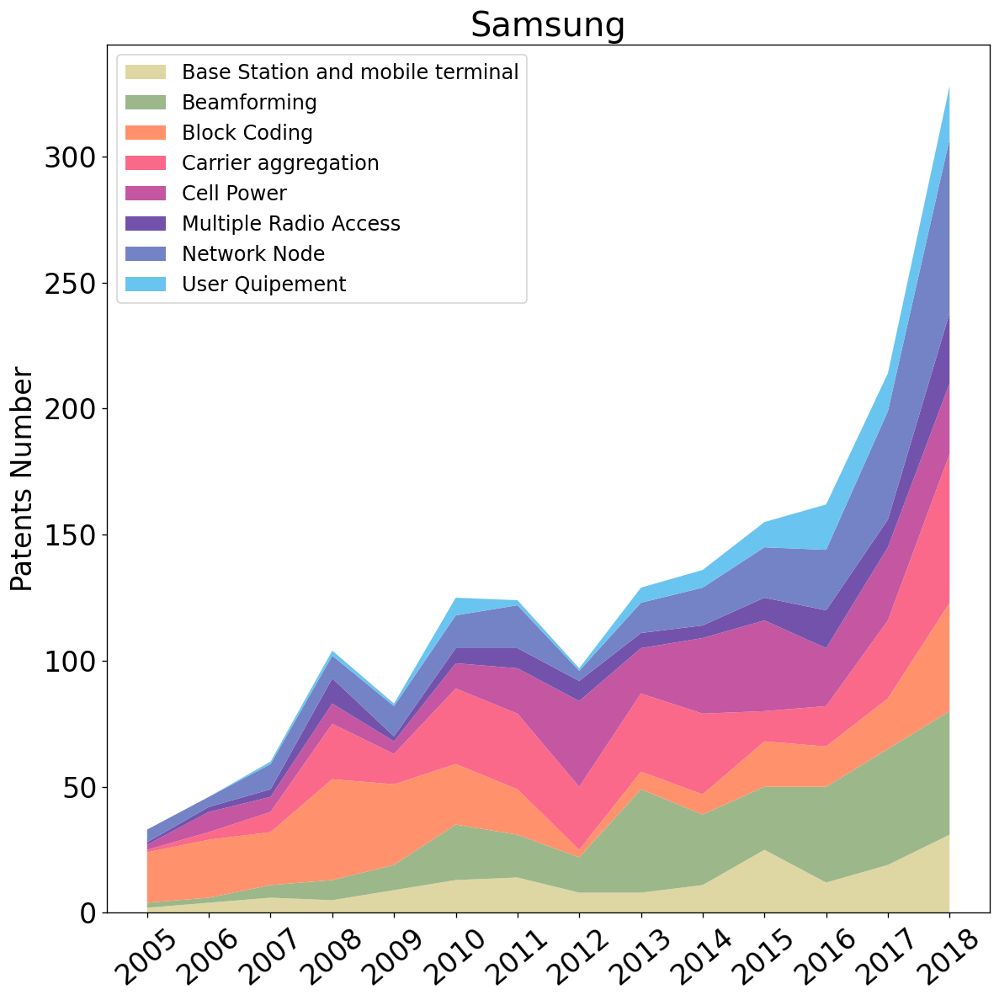

In [206]:
Base_station = S2.iloc[:,0]
Beamforming = S2.iloc[:,1]
Block_coding =S2.iloc[:,2]
Carrier_aggregation = S2.iloc[:,3]
Cell_power = S2.iloc[:,4]
Multiple_radio_access = S2.iloc[:,5]
Network_node = S2.iloc[:,6]
User_quipement = S2.iloc[:,7]

plt.figure(figsize=(10,10),dpi=120)
labels = ['Base Station and mobile terminal', 'Beamforming', 'Block Coding',
       'Carrier aggregation', 'Cell Power', 'Multiple Radio Access',
       'Network Node', 'User Quipement']
plt.stackplot(year,Base_station,Beamforming,Block_coding,
              Carrier_aggregation,Cell_power,Multiple_radio_access,
              Network_node,User_quipement, labels =labels,
              colors = color_list) 
plt.legend(loc = "upper left", ncol=1,fontsize = "x-large" )

plt.title("Samsung",size =24)
plt.ylabel('Patents Number',size = 20)
plt.xticks(np.arange(2005,2019,step=1), rotation=40, size = 20)
plt.yticks(size = 20)

plt.savefig(r"C:\Users\jiame\Desktop\NLP\5G_picture\Samsung_stacked_area.jpg")
plt.show()


### -----

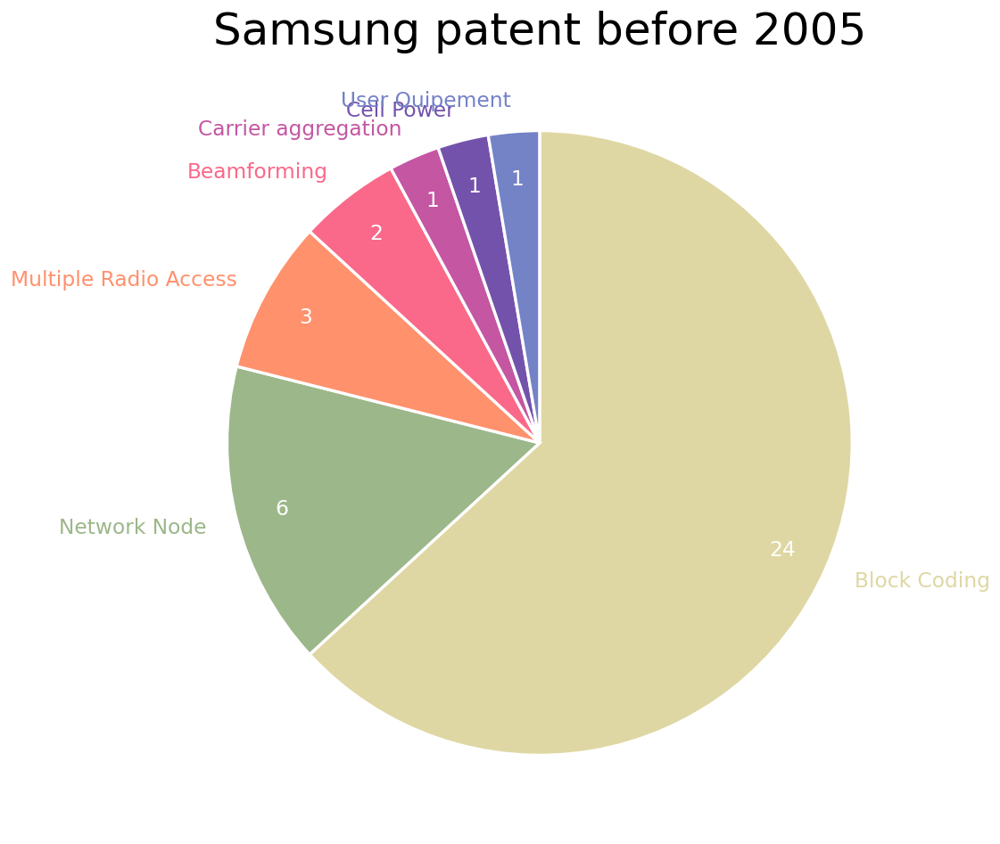

In [207]:
data3 = company_df.loc[(company_df["Assignee"] == "Samsung") & (company_df["YearPublished"] <= 2004),:]
data3 = data3.groupby(['Topic_Labels']).size().reset_index(name="PatentNumber")
data3 = data3.sort_values(by="PatentNumber",ascending=False )


labels = list(data3["Topic_Labels"])
sizes = list(data3["PatentNumber"])

def pie_chart_growth_year(lables,sizes):
    fig1,ax1 = plt.subplots(figsize=(20,8),dpi=120)
    patches, texts, pcts = ax1.pie(sizes, labels=labels,
                                   pctdistance=0.85,
                                   autopct=lambda x: '{:.0f}'.format(x*sum(sizes)/100),
                                   wedgeprops={'linewidth': 2.0, 'edgecolor': 'white'},
                                   textprops={'fontsize': 14},
                                   counterclock = False,
                                   startangle=90)

    for i, patch in enumerate(patches):
        texts[i].set_color(patch.get_facecolor())
    plt.setp(pcts, color='white')
    plt.setp(texts, fontweight=200)
    ax1.set_title("Samsung patent before 2005",fontsize=30)
    plt.tight_layout()
    
pie_chart_growth_year(labels,sizes)
plt.savefig(r"C:\Users\jiame\Desktop\NLP\5G_picture\Samsung_before_2005.jpg")

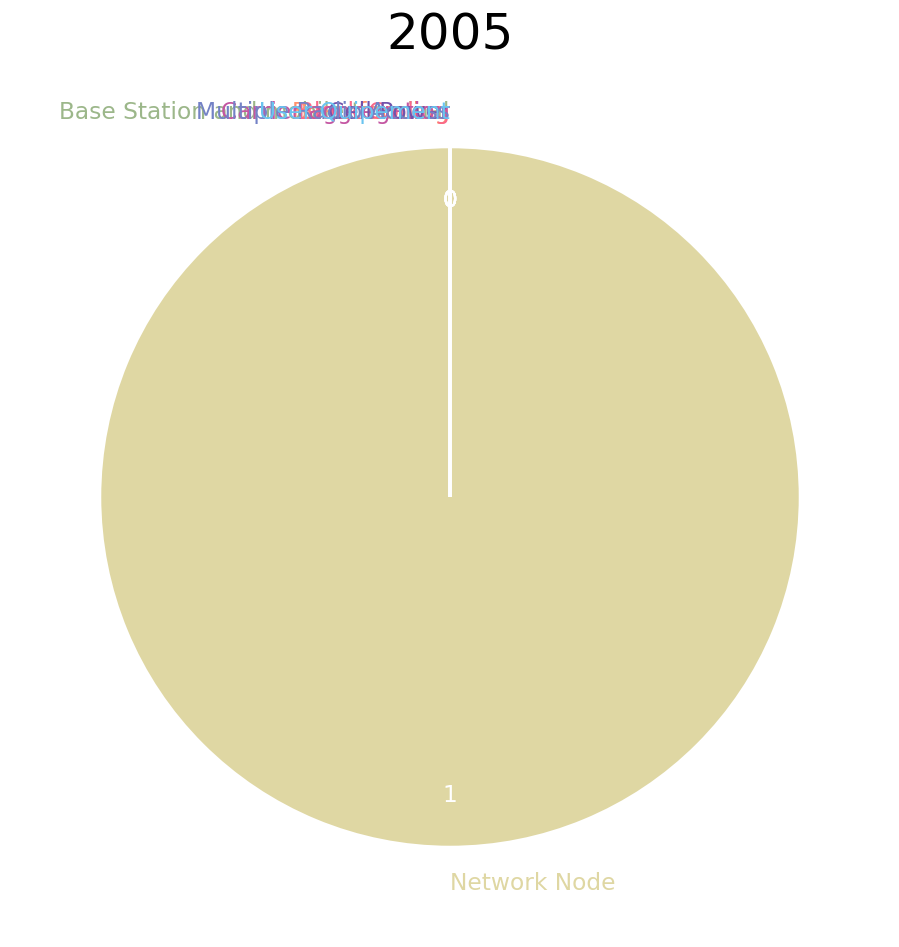

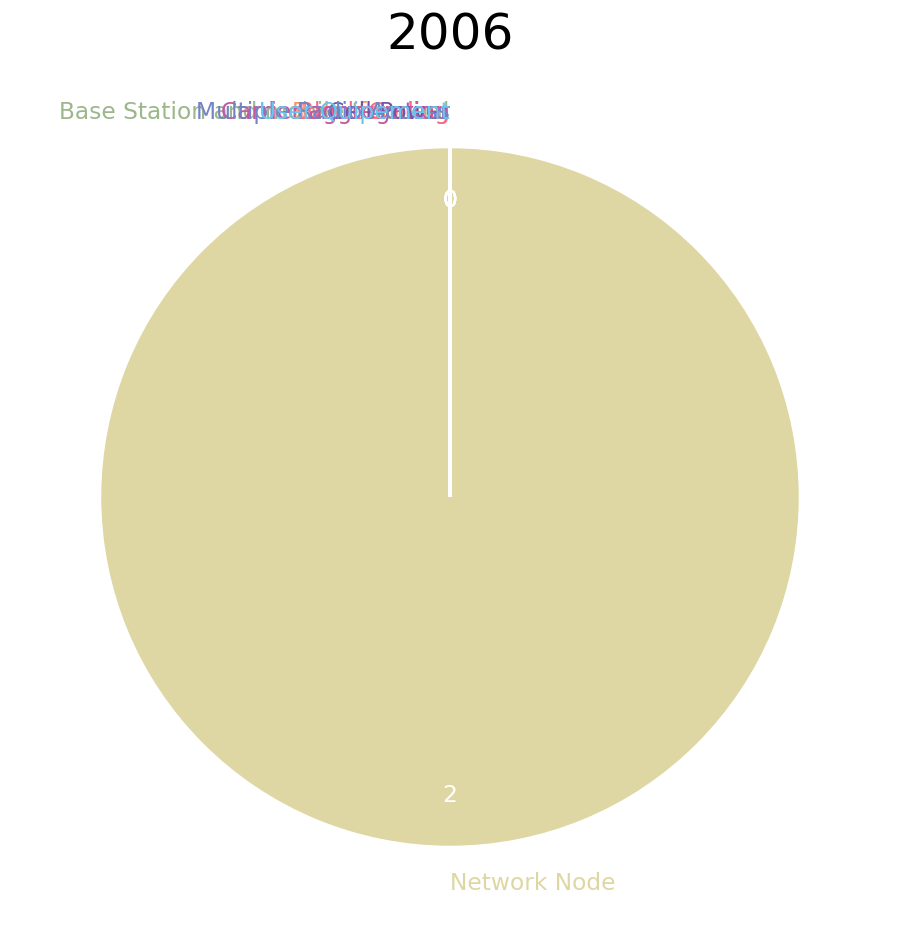

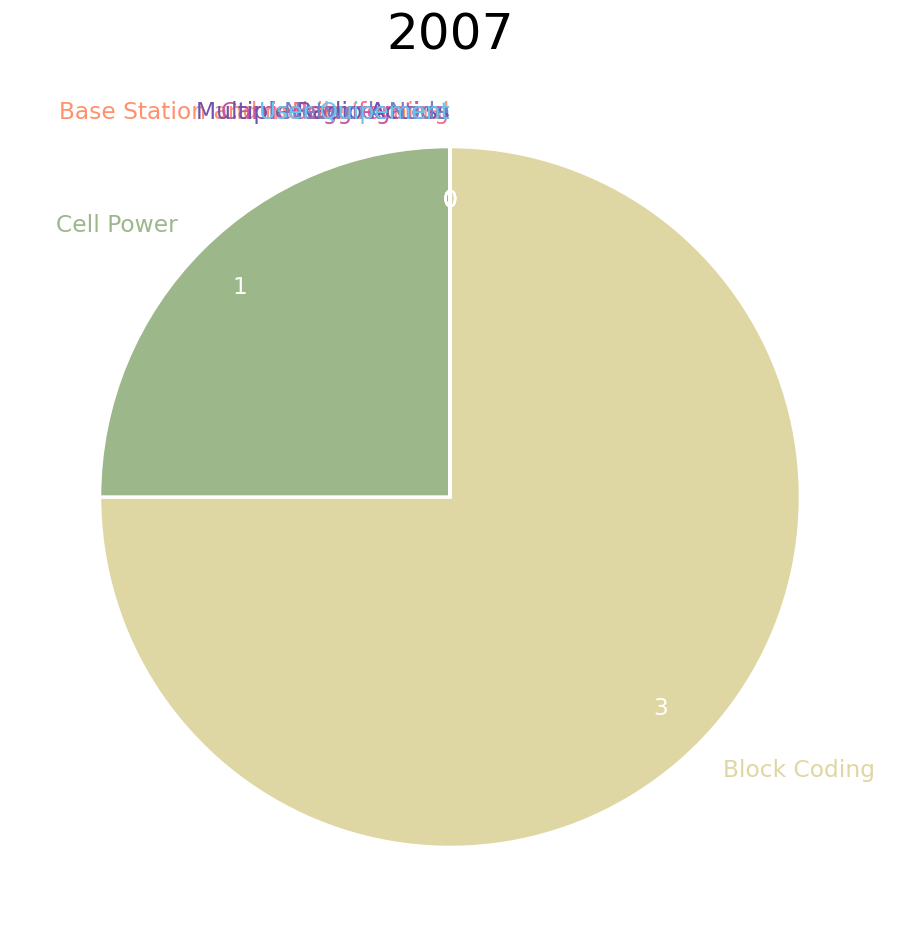

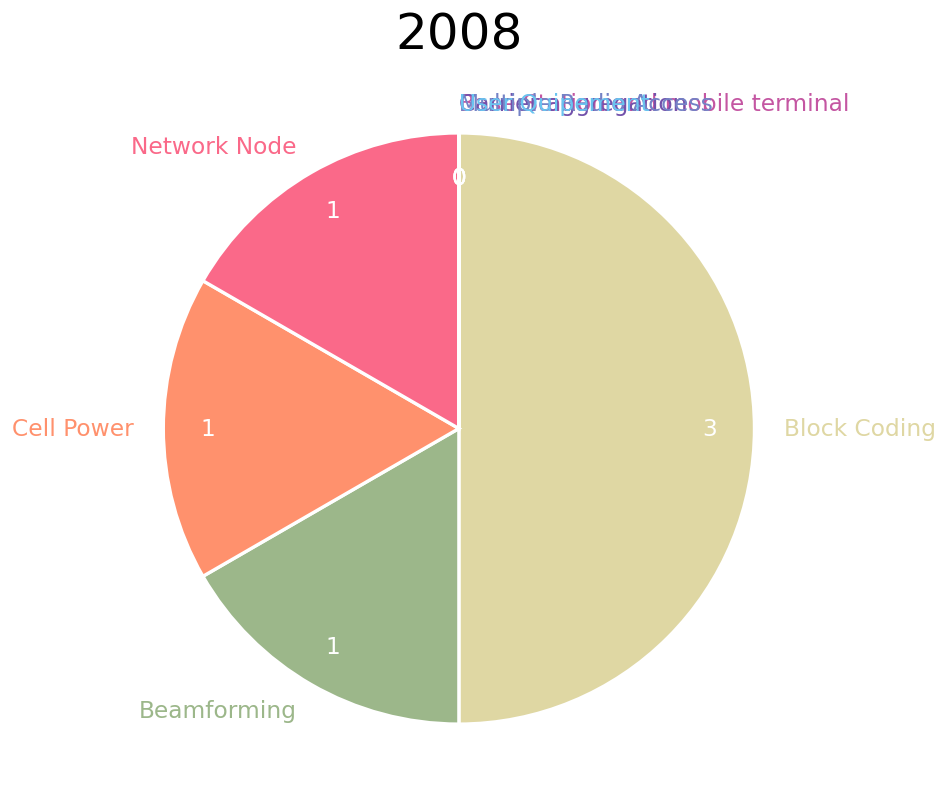

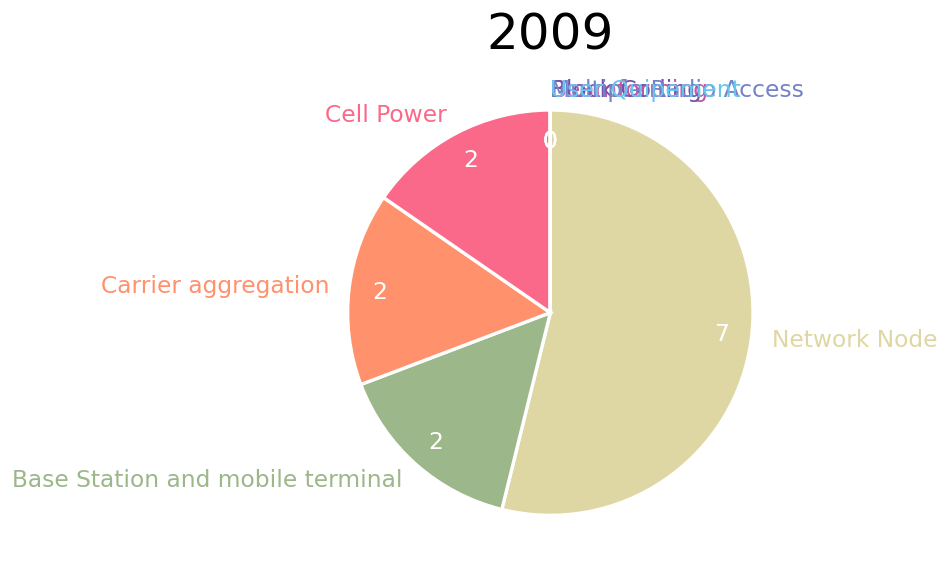

...

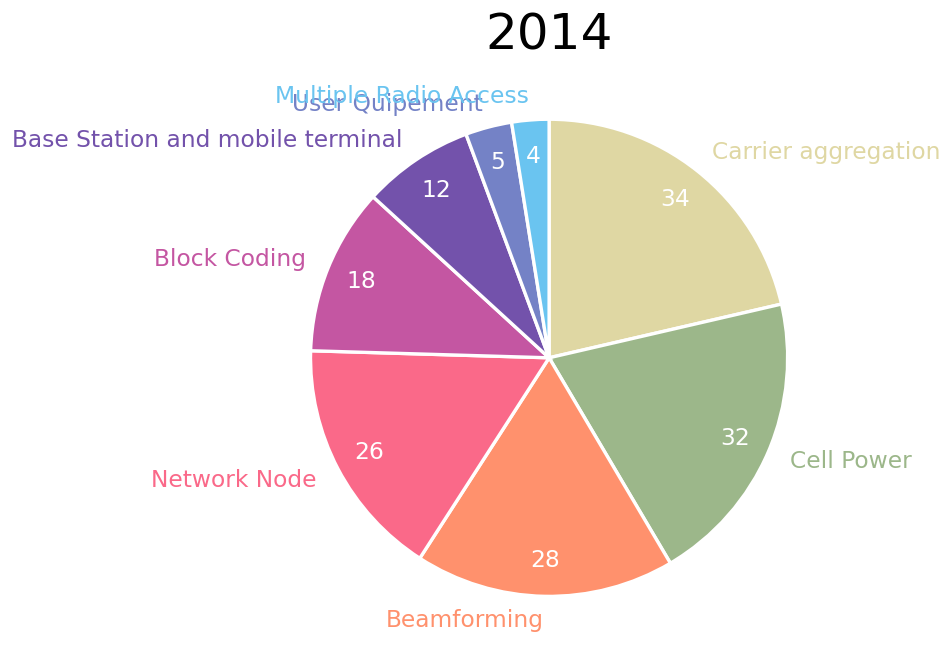

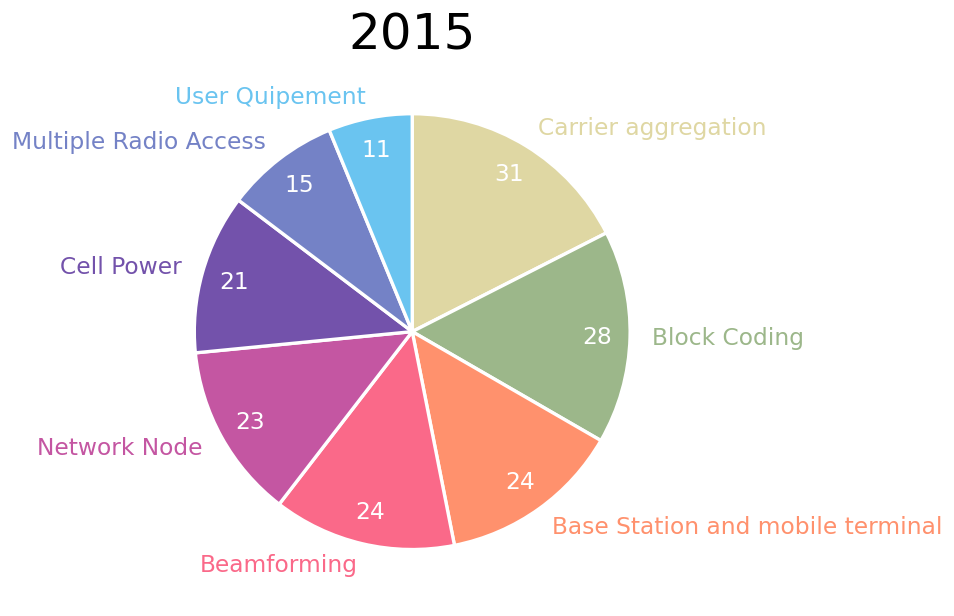

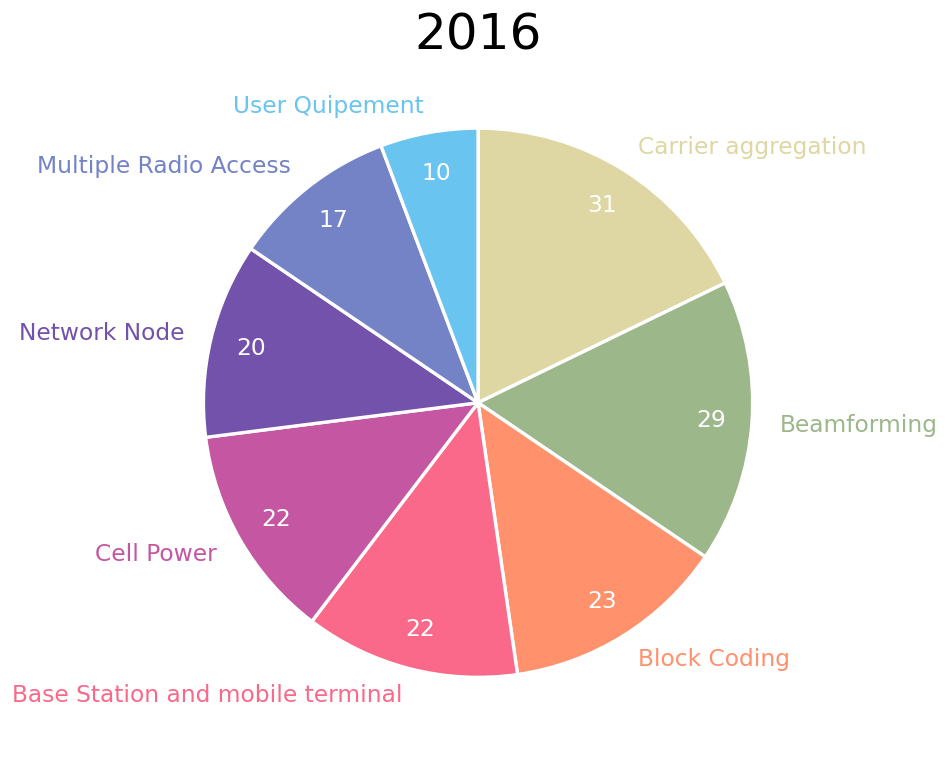

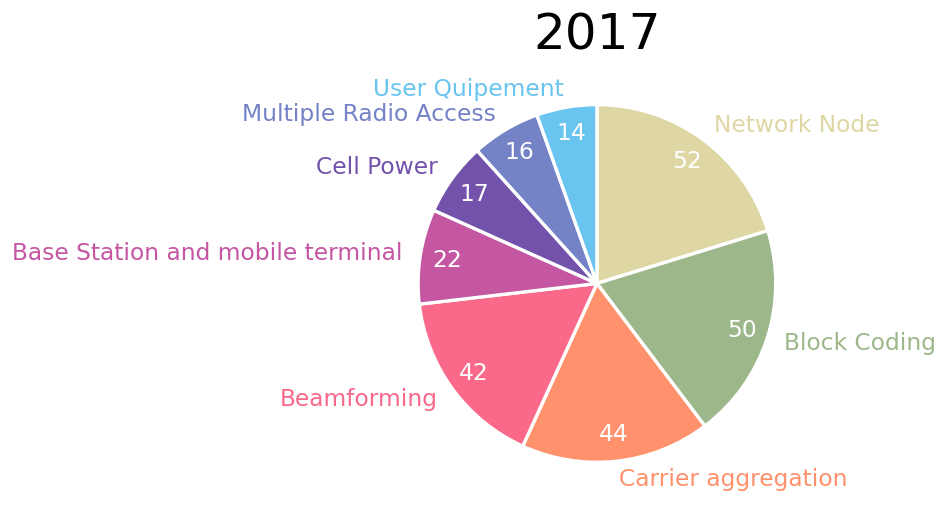

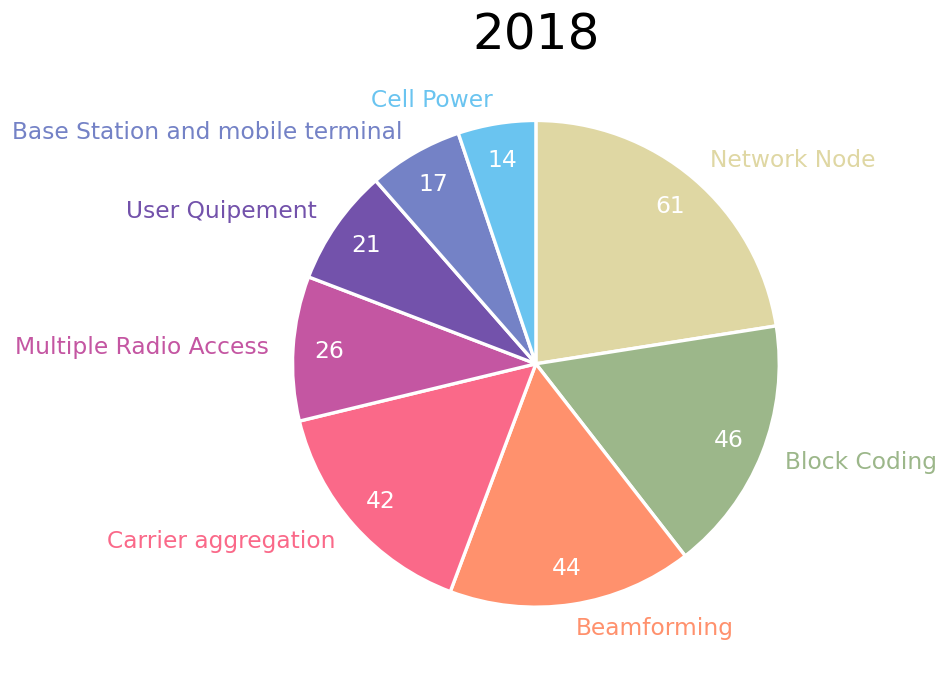

In [208]:
# labels = list(S2.columns)
# labels = [str(i) for i in labels]
year = np.arange(2005,2019)
year = [str(y) for y in year]

for index,i in enumerate(range(H2.shape[0])):
    sizes = list(H2.iloc[i,:])
    labels = list(H2.columns)
    labels = [str(i) for i in labels]
    df = pd.DataFrame(list(zip(labels,sizes)),columns=["labels","sizes"])
    df = df.sort_values(by="sizes",ascending=False)
    labels = list(df.iloc[:,0])
    sizes = list(df.iloc[:,1])
    
    fig1,ax1 = plt.subplots(figsize=(8,8),dpi=120)
    patches, texts, pcts = ax1.pie(sizes, labels=labels,
                                   pctdistance=0.85,
                                   autopct=lambda x: '{:.0f}'.format(x*sum(sizes)/100),
                                   wedgeprops={'linewidth': 2.0, 'edgecolor': 'white'},
                                   textprops={'fontsize': 14},
                                   counterclock = False,
                                   startangle=90)

    for i, patch in enumerate(patches):
        texts[i].set_color(patch.get_facecolor())
    plt.setp(pcts, color='white')
    plt.setp(texts, fontweight=200)
    ax1.set_title("{}".format(year[index]),fontsize=30)
    plt.tight_layout()
    plt.savefig(r"C:\Users\jiame\Desktop\NLP\Huawei\{}.jpg".format(year[index]))
    
    plt.show()



### Gap 1

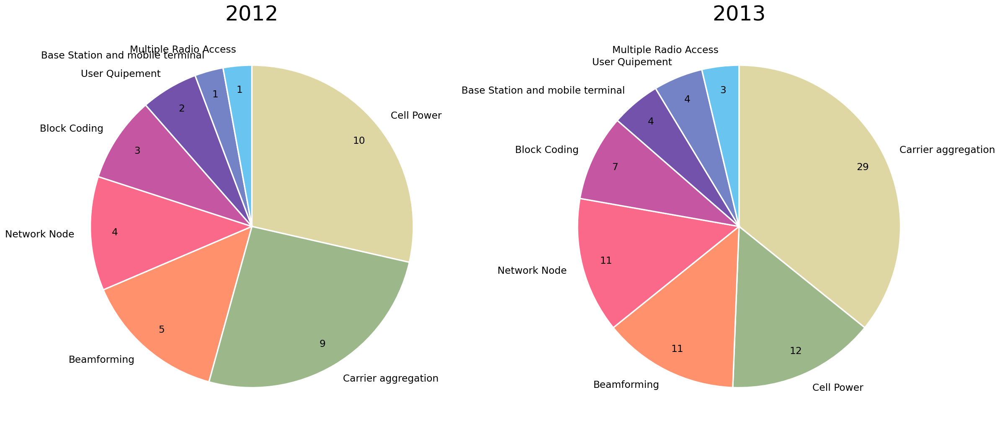

In [305]:
fig, axs = plt.subplots(1, 2,figsize=(20,10),dpi=120)

# plot for 2012
sizes = list(H2.iloc[7,:])
labels = list(H2.columns)
labels = [str(i) for i in labels]
df = pd.DataFrame(list(zip(labels,sizes)),columns=["labels","sizes"])
df = df.sort_values(by="sizes",ascending=False)
labels = list(df.iloc[:,0])
sizes = list(df.iloc[:,1])

patches, texts, pcts = axs[0].pie(sizes, labels=labels,
                               pctdistance=0.85,
                               autopct=lambda x: '{:.0f}'.format(x*sum(sizes)/100),
                               wedgeprops={'linewidth': 2.0, 'edgecolor': 'white'},
                               textprops={'fontsize': 14},
                               counterclock = False,
                               startangle=90)

# for i, patch in enumerate(patches):
#     texts[i].set_color(patch.get_facecolor())
plt.setp(pcts, color='black')
plt.setp(texts, fontweight=200)
axs[0].set_title("{}".format("2012"),fontsize=30)
plt.tight_layout()

# plot for 2013
sizes = list(H2.iloc[8,:])
labels = list(H2.columns)
labels = [str(i) for i in labels]
df = pd.DataFrame(list(zip(labels,sizes)),columns=["labels","sizes"])
df = df.sort_values(by="sizes",ascending=False)
labels = list(df.iloc[:,0])
sizes = list(df.iloc[:,1])

patches, texts, pcts = axs[1].pie(sizes, labels=labels,
                               pctdistance=0.85,
                               autopct=lambda x: '{:.0f}'.format(x*sum(sizes)/100),
                               wedgeprops={'linewidth': 2.0, 'edgecolor': 'white'},
                               textprops={'fontsize': 14},
                               counterclock = False,
                               startangle=90)

# for i, patch in enumerate(patches):
#     texts[i].set_color(patch.get_facecolor())
plt.setp(pcts, color='black')
plt.setp(texts, fontweight=200)
axs[1].set_title("{}".format("2013"),fontsize=30)
plt.tight_layout()

plt.savefig(r"C:\Users\jiame\Desktop\NLP\Huawei\2012-2013.jpg")


### Gap 2

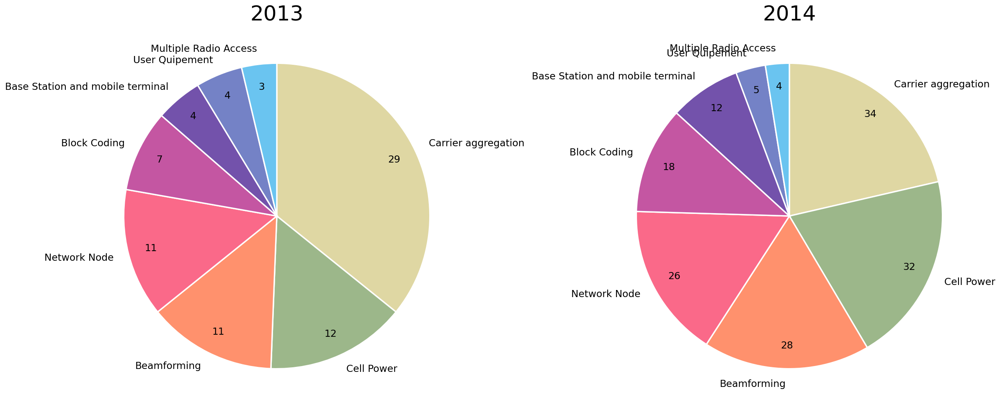

In [306]:
fig, axs = plt.subplots(1, 2,figsize=(20,10),dpi=120)

# plot for 2013
sizes = list(H2.iloc[8,:])
labels = list(H2.columns)
labels = [str(i) for i in labels]
df = pd.DataFrame(list(zip(labels,sizes)),columns=["labels","sizes"])
df = df.sort_values(by="sizes",ascending=False)
labels = list(df.iloc[:,0])
sizes = list(df.iloc[:,1])

patches, texts, pcts = axs[0].pie(sizes, labels=labels,
                               pctdistance=0.85,
                               autopct=lambda x: '{:.0f}'.format(x*sum(sizes)/100),
                               wedgeprops={'linewidth': 2.0, 'edgecolor': 'white'},
                               textprops={'fontsize': 14},
                               counterclock = False,
                               startangle=90)

# for i, patch in enumerate(patches):
#     texts[i].set_color(patch.get_facecolor())
plt.setp(pcts, color='black')
plt.setp(texts, fontweight=200)
axs[0].set_title("{}".format("2013"),fontsize=30)
plt.tight_layout()

# plot for 2014
sizes = list(H2.iloc[9,:])
labels = list(H2.columns)
labels = [str(i) for i in labels]
df = pd.DataFrame(list(zip(labels,sizes)),columns=["labels","sizes"])
df = df.sort_values(by="sizes",ascending=False)
labels = list(df.iloc[:,0])
sizes = list(df.iloc[:,1])

patches, texts, pcts = axs[1].pie(sizes, labels=labels,
                               pctdistance=0.85,
                               autopct=lambda x: '{:.0f}'.format(x*sum(sizes)/100),
                               wedgeprops={'linewidth': 2.0, 'edgecolor': 'white'},
                               textprops={'fontsize': 14},
                               counterclock = False,
                               startangle=90)

# for i, patch in enumerate(patches):
#     texts[i].set_color(patch.get_facecolor())
plt.setp(pcts, color='black')
plt.setp(texts, fontweight=200)
axs[1].set_title("{}".format("2014"),fontsize=30)
plt.tight_layout()

plt.savefig(r"C:\Users\jiame\Desktop\NLP\Huawei\2013-2014.jpg")


### Gap3

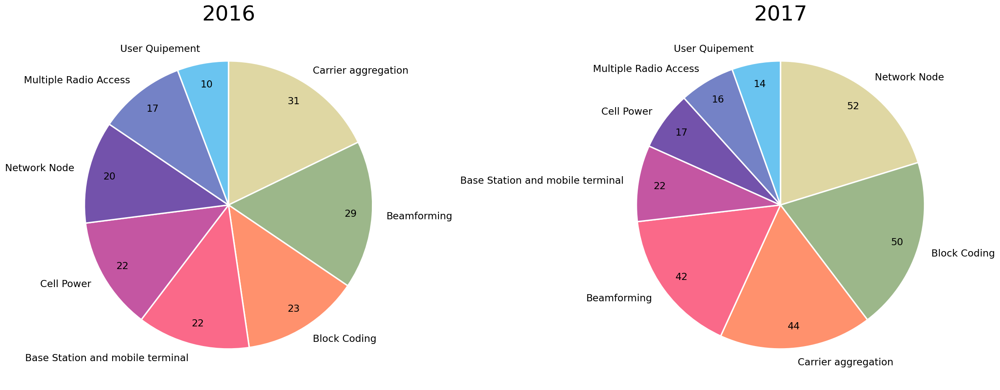

In [308]:
fig, axs = plt.subplots(1, 2,figsize=(20,10),dpi=120)

# plot for 2016
sizes = list(H2.iloc[11,:])
labels = list(H2.columns)
labels = [str(i) for i in labels]
df = pd.DataFrame(list(zip(labels,sizes)),columns=["labels","sizes"])
df = df.sort_values(by="sizes",ascending=False)
labels = list(df.iloc[:,0])
sizes = list(df.iloc[:,1])

patches, texts, pcts = axs[0].pie(sizes, labels=labels,
                               pctdistance=0.85,
                               autopct=lambda x: '{:.0f}'.format(x*sum(sizes)/100),
                               wedgeprops={'linewidth': 2.0, 'edgecolor': 'white'},
                               textprops={'fontsize': 14},
                               counterclock = False,
                               startangle=90)

# for i, patch in enumerate(patches):
#     texts[i].set_color(patch.get_facecolor())
plt.setp(pcts, color='black')
plt.setp(texts, fontweight=200)
axs[0].set_title("{}".format("2016"),fontsize=30)
plt.tight_layout()

# plot for 2017
sizes = list(H2.iloc[12,:])
labels = list(H2.columns)
labels = [str(i) for i in labels]
df = pd.DataFrame(list(zip(labels,sizes)),columns=["labels","sizes"])
df = df.sort_values(by="sizes",ascending=False)
labels = list(df.iloc[:,0])
sizes = list(df.iloc[:,1])

patches, texts, pcts = axs[1].pie(sizes, labels=labels,
                               pctdistance=0.85,
                               autopct=lambda x: '{:.0f}'.format(x*sum(sizes)/100),
                               wedgeprops={'linewidth': 2.0, 'edgecolor': 'white'},
                               textprops={'fontsize': 14},
                               counterclock = False,
                               startangle=90)

# for i, patch in enumerate(patches):
#     texts[i].set_color(patch.get_facecolor())
plt.setp(pcts, color='black')
plt.setp(texts, fontweight=200)
axs[1].set_title("{}".format("2017"),fontsize=30)
plt.tight_layout()

plt.savefig(r"C:\Users\jiame\Desktop\NLP\Huawei\2016-2017.jpg")
# plt.savefig("2016-2017,jpg",transparent=True)
plt.show()


### Return top 3 topics with highest increasing rate

### Samsung

In [212]:
years = np.arange(2005,2019)
years = [str(y) for y in years]
S2_per = S2.pct_change()
S2_per = S2_per.replace([np.nan,np.inf],0)
assignee = ["Samsung"]*(len(years)-1)
# S2_per

S2_per= S2_per.join(pd.DataFrame(S2_per.apply(lambda x: x.nlargest(3).index.tolist(), axis=1).tolist(), 
                           columns=["S_1st","S_2nd","S_3rd"]))
S2_per.insert(loc=0,column="Year",value=years)
S2_per = S2_per.loc[:,["Year","S_1st","S_2nd","S_3rd"]]
S2_per = S2_per.drop([0])
# S2_per.insert(loc=1,column="Assignee",value=assignee)
S2_per
dfi.export(S2_per,'Samsung_per_increase.jpg')
# dfi.export(company_stat,'company_stat.jpg')

### Huawei

In [213]:
# years = np.arange(2005,2019)
# years = [str(y) for y in years]
H2_per = H2.pct_change()
H2_per = H2_per.replace([np.nan,np.inf],0)
# S2_per
assignee = ["Huawei"]*(len(years)-1)


H2_per= H2_per.join(pd.DataFrame(H2_per.apply(lambda x: x.nlargest(3).index.tolist(), axis=1).tolist(), 
                           columns=["H_1st","H_2nd","H_3rd"]))
# H2_per.insert(loc=0,column="Year",value=years)
H2_per = H2_per.loc[:,["H_1st","H_2nd","H_3rd"]]
H2_per = H2_per.drop([0])
# H2_per.insert(loc=1,column="Assignee",value=assignee)
H2_per
# dfi.export(S2_per,'Huawei_per_increase.jpg')

,H_1st,H_2nd,H_3rd
1,Network Node,Base Station and mobile terminal,Beamforming
2,Base Station and mobile terminal,Beamforming,Block Coding
3,Base Station and mobile terminal,Beamforming,Block Coding
4,Network Node,Cell Power,Base Station and mobile terminal
5,Carrier aggregation,Cell Power,Beamforming
6,Block Coding,Carrier aggregation,Base Station and mobile terminal
7,Cell Power,Network Node,Carrier aggregation
8,Base Station and mobile terminal,Carrier aggregation,Multiple Radio Access
9,Base Station and mobile terminal,Cell Power,Block Coding
10,Multiple Radio Access,User Quipement,Base Station and mobile terminal


In [214]:
df_combine = S2_per.join(H2_per)
df_combine
dfi.export(df_combine,'df_combine.jpg')

### Leading Technologies in Samsung & Huawei

In [283]:
df_dominant_topic.head()

def rank_company_patent(company_name):
    df6 = df_dominant_topic.groupby("Topic_Labels")
    appened_df = []

    for i in range(len(topic_list)):
        df7 = df6.get_group(topic_list[i])
        df7 = df7.sort_values(by="Topic_Perc_Contrib",ascending=False)
        df7["Rank"]= list(np.arange(df7.shape[0])+1)

        df8 =df7.loc[df7["Assignee"] == company_name ,:]
        df8 = df8.iloc[0:1,]
        appened_df.append(df8)
    #     print(df3)

    dominant_tech2 = pd.concat(appened_df)
    return dominant_tech2        

In [284]:
# Samsung 
Sam_rank = rank_company_patent("Samsung")
Sam_rank = Sam_rank.drop(["Keywords","Text"],axis=1)
Sam_rank
dfi.export(Sam_rank,'Sam_rank.jpg')

In [285]:
# Huawei
H_rank = rank_company_patent("Huawei")
H_rank = H_rank.drop(["Keywords","Text"],axis=1)
H_rank
# dfi.export(H_rank,'H_rank.jpg')

,Document_No,Assignee,YearPublished,Dominant_Topic,Topic_Labels,Topic_Perc_Contrib,Rank
6509,6509,Huawei,2018,0,User Quipement,0.4917,7
6317,6317,Huawei,2018,1,Multiple Radio Access,0.4207,147
7209,7209,Huawei,2014,2,Carrier aggregation,0.5318,4
7344,7344,Huawei,2013,3,Cell Power,0.5557,4
6778,6778,Huawei,2017,4,Beamforming,0.6000,3
6698,6698,Huawei,2017,5,Block Coding,0.6706,1
6931,6931,Huawei,2016,6,Network Node,0.6801,1
7287,7287,Huawei,2014,7,Base Station and mobile terminal,0.4248,23
